# 1. Import Library

In [1]:
#Standard libraries
import pandas as pd
import pandas_profiling as pp
import numpy as np
import statistics as stat
import warnings
warnings.filterwarnings("ignore")

#Graph libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="darkgrid")
from prettytable import PrettyTable

#Counter library
from collections import Counter

#ProfileReport Library
from pandas_profiling import ProfileReport

#Sklearn Library
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#Imblearn Library
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, EditedNearestNeighbours
from imblearn.combine import SMOTEENN, SMOTETomek

from prettytable import PrettyTable

#Machine Learning Algorithm Library
import xgboost as xg
import lightgbm as lgb
import catboost as cb

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

from pprint import pprint

from sklearn.model_selection import GridSearchCV

#Libraries for model measurement
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, log_loss

# 2. Import Data

In [2]:
#import data from test.csv file
test = pd.read_csv('test.csv')
test.head()

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients
0,2294049,Benefit Cosmetics,Eye Palettes,Brow Zings Pro Palette,no size,3.5,15,2200,39.0,39.0,https://www.sephora.com/product/brow-zings-pro...,False,no options,What it is: A portable eyebrow palette feature...,Suggested Usage:-Apply brow wax and brow powde...,Wax Shade One: Ricinus Communis (Castor) Seed ...
1,2294312,FENTY BEAUTY by Rihanna,Mascara,"Full Frontal Volume, Lift & Curl Mascara",0.42 fl oz / 12.5 mL,4.0,2000,32900,24.0,24.0,https://www.sephora.com/product/fenty-beauty-r...,True,no options,What it is: A do-it-all mascara that is design...,Suggested Usage:-Use the Fat side to load and ...,Aqua/Water/Eau- Synthetic Beeswax- Paraffin- P...
2,2294346,Atelier Cologne,Perfume Gift Sets,Clementine California Cologne Absolue Pure Per...,1 oz/ 30 mL,0.0,0,206,80.0,80.0,https://www.sephora.com/product/clementine-cal...,True,no options,Fragrance Family: FreshScent Type: Fresh Citru...,Suggested Usage:-Fragrance is intensified by t...,unknown
3,2294353,Atelier Cologne,Perfume Gift Sets,Orange Sanguine Cologne Absolue Pure Perfume +...,1 oz/ 30 mL,0.0,0,232,80.0,80.0,https://www.sephora.com/product/orange-sanguin...,True,no options,Fragrance Family: FreshScent Type: Fresh Citru...,Suggested Usage:-Fragrance is intensified by t...,unknown
4,2294361,Atelier Cologne,Perfume Gift Sets,Pacific Lime Cologne Absolue Pure Perfume + Le...,1 oz/ 30 mL,0.0,0,138,80.0,80.0,https://www.sephora.com/product/pacific-lime-c...,True,no options,Fragrance Family: FreshScent Type: Fresh Citru...,Suggested Usage:-Fragrance is intensified by t...,unknown


In [3]:
test.shape

(1168, 16)

In [4]:
#import data from train.csv file
train = pd.read_csv('train.csv')
train.head()

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
0,50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0
1,304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
2,404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
3,443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
4,463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0


In [5]:
#To see the bottom 5 of the data
train.tail()

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
7995,2293207,VOLUSPA,Candles,White Cypress Hearth Glass Jar Candle,no size,0.0,0,194,85.0,85.0,https://www.sephora.com/product/white-cypress-...,True,no options,Fragrance Family: Earthy & WoodyScent Type: Cl...,Suggested Usage:-Fragrance is intensified by t...,unknown,0
7996,2293439,TOM FORD,Lipstick,Extreme Lip Spark Lipstick,no size,4.0,30,12400,55.0,55.0,https://www.sephora.com/product/extreme-lip-sp...,False,no options,What it is: An ultra-gliding- metallic- sequin...,Suggested Usage:-Apply lipstick to the lips fo...,-Light Vegetable Emollient: Helps smooth and s...,0
7997,2293488,FENTY BEAUTY by Rihanna,Lip Sets,Pro Kiss'r Duo: Scrubstick + Lip Balm Set,no size,4.5,22,12900,29.0,34.0,https://www.sephora.com/product/pro-kiss-r-duo...,True,no options,What it is: A set of two full-sized essentials...,Suggested Usage:-Swipe Pro Kiss’r Lip-Loving S...,Pro Kiss’r Lip-Loving Scrubstick: Caprylic/C...,1
7998,2293793,tarte,Mascara,Travel Size Gifted Amazonian Clay Smart Mascara,no size,4.5,5,2400,12.0,12.0,https://www.sephora.com/product/travel-size-gi...,True,no options,What it is: An Amazonian-clay-infused lengthen...,Suggested Usage:-Wedge the wand at the base of...,-Amazonian Clay: Balances- nourishes- hydrates...,0
7999,2293801,John Varvatos,Perfume,John Varvatos x Nick Jonas Silver Edition Eau ...,4.2 oz/ 125 mL,0.0,0,60,94.0,94.0,https://www.sephora.com/product/john-varvatos-...,True,- 4.2 oz/ 125 mL Eau de Toilette Spray - 2.5...,Fragrance Family: Earthy & Woody\n\nScent Type...,Suggested Usage:\n-Fragrance is intensified by...,Alcohol Denat.- Aqua/Water/Eau- Parfum (Fragr...,0


# 3. Data Understanding

In [6]:
#to see statistics summary from the data
train.describe(include = 'all')

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
count,8.000000e+03,8000,8000,8000,8000,8000.000000,8000.000000,8.000000e+03,8000.000000,8000.000000,8000,8000,8000,8000,8000,8000,8000.000000
unique,NaN,310,142,7945,1459,NaN,NaN,NaN,NaN,NaN,8000,2,528,7741,5683,6030,NaN
top,NaN,SEPHORA COLLECTION,Perfume,Blush,no size,NaN,NaN,NaN,NaN,NaN,https://www.sephora.com/product/blackhead-diss...,False,no options,no details,no instructions,unknown,NaN
freq,NaN,492,620,4,2649,NaN,NaN,NaN,NaN,NaN,1,4374,7269,14,1489,1407,NaN
mean,1.910231e+06,NaN,NaN,NaN,NaN,4.087313,303.694250,1.757584e+04,49.903846,51.082835,NaN,NaN,NaN,NaN,NaN,NaN,0.255875
std,3.858353e+05,NaN,NaN,NaN,NaN,0.758233,931.236885,4.421160e+04,46.854991,48.513402,NaN,NaN,NaN,NaN,NaN,NaN,0.436379
min,5.000000e+01,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000e+00,2.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,1.773379e+06,NaN,NaN,NaN,NaN,4.000000,14.000000,2.000000e+03,24.000000,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,2.030360e+06,NaN,NaN,NaN,NaN,4.000000,56.000000,5.500000e+03,35.000000,35.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
75%,2.185074e+06,NaN,NaN,NaN,NaN,4.500000,232.000000,1.540000e+04,59.000000,60.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000


In [7]:
#To see the value in exclusive variable in train dataset 
train['exclusive'].value_counts()

0    5953
1    2047
Name: exclusive, dtype: int64

In [8]:
train['id'].value_counts()

2161636    2
2187110    2
1873173    2
1808054    2
1688845    2
          ..
2183887    1
1925841    1
1602259    1
1895663    1
1785856    1
Name: id, Length: 7951, dtype: int64

In [9]:
train['brand'].value_counts()

SEPHORA COLLECTION    492
CLINIQUE              211
TOM FORD              150
tarte                 143
Kiehl's Since 1851    122
                     ... 
8Greens                 1
Jillian Dempsey         1
Flora + Bast            1
Makeup Eraser           1
DL.MD                   1
Name: brand, Length: 310, dtype: int64

In [10]:
train['category'].value_counts()

Perfume                      620
Moisturizers                 398
Face Serums                  334
Value & Gift Sets            241
Face Wash & Cleansers        225
                            ... 
Hair Thinning & Hair Loss      1
Lip Treatments                 1
Body Moisturizers              1
Accessories                    1
Curls & Coils                  1
Name: category, Length: 142, dtype: int64

In [11]:
train[train['category']== 'no category']

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
0,50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0
1,304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
2,404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
3,443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
4,463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0
477,1233121,Viktor&Rolf,no category,Flowerbomb Mini,0.68 oz/ 20 mL,4.5,4000,13600,55.0,55.0,https://www.sephora.com/product/flowerbomb-min...,False,no options,Fragrance Family: Warm & SpicyScent Type: Warm...,no instructions,Alcohol-\nParfum / Fragrance-\nAqua / Water-\n...,0
647,1350966,Jack Black,no category,Supreme Cream Triple Cushion™ Shave Lather Mini,no size,0.0,0,94,13.0,13.0,https://www.sephora.com/product/supreme-cream-...,True,no options,What it is:The ultimate rich lather shave crea...,Suggested Usage:-Activate lather with fingerti...,-Macadamia Nut Oil and Soybean Oil: Deeply so...,0
1954,1765023,SEPHORA COLLECTION,no category,Eye Mask - Pearl - Brightening,1 Pair,4.5,12,0,5.0,5.0,https://www.sephora.com/product/eye-mask-pearl...,True,no options,To redeem your offer: \n1. SELECT FOUR MASKS: ...,no instructions,-White Pearl From Natural Origin: Brightens a...,1
1955,1765056,SEPHORA COLLECTION,no category,Eye Mask - Pomegranate - Energizing,1 Pair,3.5,26,0,5.0,5.0,https://www.sephora.com/product/eye-mask-pomeg...,True,no options,To redeem your offer: \n1. SELECT FOUR MASKS: ...,no instructions,-Natural Pomegranate Extract: Tones and energ...,1
4076,2032159,Kiehl's Since 1851,no category,Creme de Corps Nourishing Dry Body Oil Mini,no size,4.5,2,0,18.0,18.0,https://www.sephora.com/product/creme-de-corps...,False,no options,Which skin type is it good for?✔ Normal✔ Oily✔...,Suggested Usage:-Mist onto clean skin and gent...,-Grapeseed Oil: Rich in essential fatty acids...,0


In [12]:
train['name'].value_counts()

Blush                                                          4
Pour Homme                                                     3
Lip Gloss                                                      3
The Foundation Brush                                           3
Discovery Set                                                  3
                                                              ..
Visionnaire Eye Cream Advanced Multi-Correcting Eye Balm       1
Colour Protect Conditioner                                     1
Beauty Dust Box                                                1
Crème Ancienne® Supreme Face Serum                             1
Oil Eliminator Deep Cleansing Exfoliating Face Wash For Men    1
Name: name, Length: 7945, dtype: int64

In [13]:
train['size'].value_counts()

no size                      2649
1.7 oz/ 50 mL                 452
1 oz/ 30 mL                   337
3.4 oz/ 100 mL                172
0.5 oz/ 15 mL                 154
                             ... 
0.106 oz/ 3.01 g                1
1.01oz/30mL                     1
0.116 oz/ 3.3 mL                1
5 x 5.5 ml                      1
10 x 0.08 oz/ 10 x 2.26 g       1
Name: size, Length: 1459, dtype: int64

In [14]:
train['rating'].value_counts()

4.5    3181
4.0    2655
3.5     974
5.0     655
3.0     270
0.0     140
2.5      77
2.0      26
1.0      15
1.5       7
Name: rating, dtype: int64

In [15]:
train['number_of_reviews'].value_counts()

1000     357
3        192
5        168
4        168
2        162
        ... 
558        1
566        1
578        1
586        1
12000      1
Name: number_of_reviews, Length: 818, dtype: int64

In [16]:
train['love'].value_counts()

0         150
1500      113
1100      103
1800       99
2100       94
         ... 
294         1
290         1
397600      1
380         1
168100      1
Name: love, Length: 1496, dtype: int64

In [17]:
train['MarketingFlags'].value_counts()

False    4374
True     3626
Name: MarketingFlags, dtype: int64

In [18]:
train['options'].value_counts()

no options                                                                                                                               7269
 - 1.7 oz/ 50 mL Eau de Parfum Spray                                                                                                       16
 - 1.0 oz/ 30 mL  Spray - 3.4 oz/ 100 mL  Spray                                                                                            13
 - 1.7 oz/ 50 mL Eau de Parfum Spray  - 3.4 oz/ 100 mL Eau de Parfum Spray                                                                 13
 - 0.34 oz/ 10 mL Eau de Parfum Travel Spray                                                                                               11
                                                                                                                                         ... 
 - 1.7 oz/ 50 mL Eau de Parfum Spray  - 3.4 oz/ 100 mL Eau de Parfum Spray - 8.4 oz/ 248 mL Eau de Parfum Spray                             1
 - 2.5

In [19]:
train['options']

0                                              no options
1                                              no options
2                                              no options
3                                              no options
4                                              no options
                              ...                        
7995                                           no options
7996                                           no options
7997                                           no options
7998                                           no options
7999     - 4.2 oz/ 125 mL Eau de Toilette Spray  - 2.5...
Name: options, Length: 8000, dtype: object

In [20]:
train['details'].value_counts()

no details                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [21]:
train['how_to_use'].value_counts()

no instructions                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  1489
Suggested Usage:-Fragrance is intensified by the warmth of your own body. Apply in the creases of your knees and elbows for a longer-lasting- stronger scent. -After applying- avoid rubbing or dabbing skin. This breaks down the

In [22]:
train['ingredients'].value_counts()

unknown                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [23]:
#to see information about the train dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 8000 non-null   int64  
 1   brand              8000 non-null   object 
 2   category           8000 non-null   object 
 3   name               8000 non-null   object 
 4   size               8000 non-null   object 
 5   rating             8000 non-null   float64
 6   number_of_reviews  8000 non-null   int64  
 7   love               8000 non-null   int64  
 8   price              8000 non-null   float64
 9   value_price        8000 non-null   float64
 10  URL                8000 non-null   object 
 11  MarketingFlags     8000 non-null   bool   
 12  options            8000 non-null   object 
 13  details            8000 non-null   object 
 14  how_to_use         8000 non-null   object 
 15  ingredients        8000 non-null   object 
 16  exclusive          8000 

In [24]:
train.isnull().any()

id                   False
brand                False
category             False
name                 False
size                 False
rating               False
number_of_reviews    False
love                 False
price                False
value_price          False
URL                  False
MarketingFlags       False
options              False
details              False
how_to_use           False
ingredients          False
exclusive            False
dtype: bool

# 4. Data Cleansing

## 4.1 Null value analysis

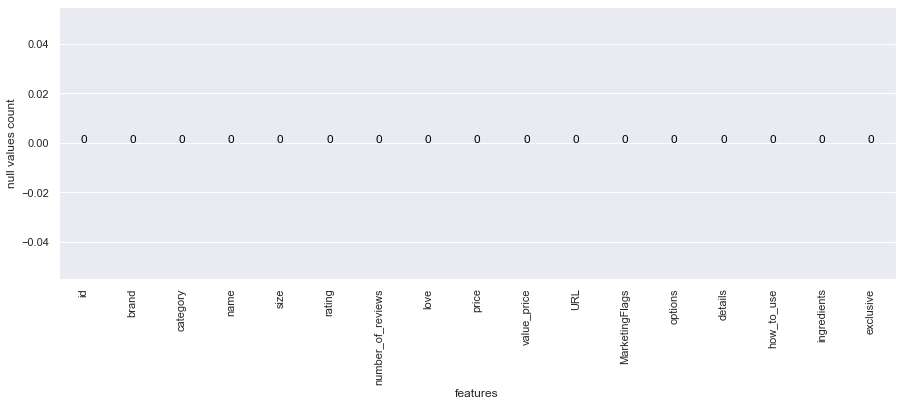

In [25]:
null_df = train.isnull().sum().reset_index()
plt.figure(figsize=(15,5))
ax = sns.barplot(null_df["index"], null_df[0], palette="husl")
ax.set(xlabel="features", ylabel="null values count")
ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90) #Rotate Name
[ax.text(index,value[1],value[1], color='black', ha="center") for index,value in enumerate(null_df.values)]
plt.show()

We can see there is no null values in the dataset at every variable.

## 4.2 Handling Duplicates

In [26]:
print(f"Size sebelum drop duplicate: {train.shape}")
train.drop_duplicates(inplace=True)
print(f"Size sesudah drop duplicate: {train.shape}")

Size sebelum drop duplicate: (8000, 17)
Size sesudah drop duplicate: (8000, 17)


There is no duplicate data in the train dataset

## 4.3 Cocatenate Data Train dan Testing

In [27]:
frames = [train, test]
df_gabung = pd.concat(frames)
df_gabung.head()

,id,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
0,50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0
1,304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
2,404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
3,443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
4,463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0


# 5. Data Preprocessing & Feature Engineering

In [28]:
df_gabung = df_gabung.set_index(['id'])
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive
id,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0


In [29]:
z = df_gabung['brand'].value_counts()

z1 = z.to_dict() #converts to dictionary

df_gabung['Count_Brand'] = df_gabung['brand'].map(z1) 
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive,Count_Brand
id,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496


In [30]:
df_gabung.describe()

,rating,number_of_reviews,love,price,value_price,exclusive,Count_Brand
count,9168.000000,9168.000000,9.168000e+03,9168.000000,9168.00000,8000.000000,9168.000000
mean,3.990020,282.139180,1.627859e+04,50.063237,51.82359,0.255875,83.938045
std,1.007707,890.642028,4.260651e+04,47.164989,49.45902,0.436379,109.361583
min,0.000000,0.000000,0.000000e+00,2.000000,2.00000,0.000000,1.000000
25%,4.000000,10.000000,1.600000e+03,24.000000,25.00000,0.000000,27.000000
50%,4.000000,46.000000,4.800000e+03,35.000000,35.00000,0.000000,54.000000
75%,4.500000,210.000000,1.380000e+04,59.000000,60.00000,1.000000,84.000000
max,5.000000,19000.000000,1.300000e+06,549.000000,549.00000,1.000000,496.000000


In [31]:
df_gabung['size'] = np.where(df_gabung['size'] == 'no size', 'no size','with size')

In [32]:
df_gabung['size'].value_counts()

with size    6007
no size      3161
Name: size, dtype: int64

0-1 : sangat tidak bagus
1-2 : kurang bagus
2-3 : Cukup bagus
3-4 : Bagus
4-5 : Sangat bagus

In [33]:
df_gabung['rating'].value_counts()

4.5    3527
4.0    2853
3.5    1051
5.0     872
0.0     398
3.0     308
2.5      88
2.0      39
1.0      23
1.5       9
Name: rating, dtype: int64

In [34]:
conditions = [
    (df_gabung['rating'] >= 0) & (df_gabung['rating'] < 1),
    (df_gabung['rating'] >= 1) & (df_gabung['rating'] < 2),
    (df_gabung['rating'] >= 2) & (df_gabung['rating'] < 3),
    (df_gabung['rating'] >= 3) & (df_gabung['rating'] < 4),
    (df_gabung['rating'] >= 4)
    ]

# create a list of the values we want to assign for each condition
values = ['Sangat tidak bagus', 'Kurang bagus', 'Cukup bagus', 'Bagus', 'Sangat bagus']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['Rating_Category'] = np.select(conditions, values)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category
id,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496,Sangat bagus
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus


In [35]:
conditions2 = [
    (df_gabung['number_of_reviews'] < 10),
    (df_gabung['number_of_reviews'] >= 10) & (df_gabung['number_of_reviews'] < 46),
    (df_gabung['number_of_reviews'] >= 46) & (df_gabung['number_of_reviews'] < 210),
    (df_gabung['number_of_reviews'] >= 210) 
    ]

# create a list of the values we want to assign for each condition
values2 = ['Kurang banyak', 'Cukup banyak', 'banyak', 'Sangat banyak']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['number_of_reviews_Category'] = np.select(conditions2, values2)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category
id,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496,Sangat bagus,banyak
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak


In [36]:
df_gabung['number_of_reviews_Category'].value_counts()

Cukup banyak     2351
banyak           2321
Sangat banyak    2294
Kurang banyak    2202
Name: number_of_reviews_Category, dtype: int64

In [37]:
conditions3 = [
    (df_gabung['love'] < 1600),
    (df_gabung['love'] >= 1600) & (df_gabung['love'] < 4800),
    (df_gabung['love'] >= 4800) & (df_gabung['love'] < 13800),
    (df_gabung['love'] >= 13800) 
    ]

# create a list of the values we want to assign for each condition
values3 = ['Kurang disukai', 'Cukup disukai', 'Disukai', 'Sangat disukai']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['Love_Category'] = np.select(conditions3, values3)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,MarketingFlags,options,details,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category
id,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,False,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496,Sangat bagus,banyak,Kurang disukai
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,False,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai


In [38]:
df_gabung['Love_Category'].value_counts()

Cukup disukai     2390
Sangat disukai    2299
Disukai           2292
Kurang disukai    2187
Name: Love_Category, dtype: int64

In [39]:
df_gabung['Discount'] = df_gabung['value_price'] - df_gabung['price']
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,options,details,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,no options,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496,Sangat bagus,banyak,Kurang disukai,0.0
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,no options,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0


In [40]:
df_gabung['Promo'] = np.where(df_gabung['Discount'] == 0, 'False','True')
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,details,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,What it is:- Available in denominations of $10...,no instructions,unknown,0.0,496,Sangat bagus,banyak,Kurang disukai,0.0,False
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,What it is:\n- Available in denominations of $...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False


In [41]:
df_gabung['Promo'].value_counts()

False    8619
True      549
Name: Promo, dtype: int64

In [42]:
from collections import Counter

def cari_strip(str) :
    """Function for counting the number of minus character or simbol in the data to know how many variation of product 
    (such as size) in one product"""
    counter = Counter(str)
    return counter['-']

In [43]:
cari_strip('- 1 oz Eau de Toilette Spray  - 1.6 oz/ 50 mL')

2

In [44]:
df_gabung['jumlah_option'] = df_gabung['options'].apply(cari_strip)
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,how_to_use,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,no instructions,unknown,0.0,496,Sangat bagus,banyak,Kurang disukai,0.0,False,0
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,no instructions,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0


In [45]:
df_gabung['jumlah_option'].value_counts()

0    8377
2     309
1     225
3     159
4      76
5      19
6       2
7       1
Name: jumlah_option, dtype: int64

In [46]:
df_gabung.columns

Index(['brand', 'category', 'name', 'size', 'rating', 'number_of_reviews',
       'love', 'price', 'value_price', 'URL', 'MarketingFlags', 'options',
       'details', 'how_to_use', 'ingredients', 'exclusive', 'Count_Brand',
       'Rating_Category', 'number_of_reviews_Category', 'Love_Category',
       'Discount', 'Promo', 'jumlah_option'],
      dtype='object')

In [47]:
df_gabung['details_category'] = np.where(df_gabung['details'] == 'no details', 'no details','with details')
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,ingredients,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option,details_category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,unknown,0.0,496,Sangat bagus,banyak,Kurang disukai,0.0,False,0,with details
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,unknown,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details


In [48]:
df_gabung['details_category'].value_counts()

with details    9154
no details        14
Name: details_category, dtype: int64

In [49]:
df_gabung['how_to_use_category'] = np.where(df_gabung['how_to_use'] == 'no instructions', 'no instructions','with intructions')
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,exclusive,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,0.0,496,Sangat bagus,banyak,Kurang disukai,0.0,False,0,with details,no instructions
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,0.0,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions


In [50]:
df_gabung['how_to_use_category'].value_counts()

with intructions    7595
no instructions     1573
Name: how_to_use_category, dtype: int64

In [51]:
df_gabung['ingredients_category'] = np.where(df_gabung['ingredients'] == 'unknown', 'unknown','with ingredients')
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Count_Brand,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,496,Sangat bagus,banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,496,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown


In [52]:
df_gabung['ingredients_category'].value_counts()

with ingredients    7538
unknown             1630
Name: ingredients_category, dtype: int64

In [53]:
df_gabung['completeness'] = np.where(((df_gabung['details_category'] == 'with details') & 
                   (df_gabung['how_to_use_category'] == 'with intructions') &
                   (df_gabung['ingredients_category'] == 'with ingredients') &
                                  (df_gabung['size'] == 'with size')), True,False)

In [54]:
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Rating_Category,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,Sangat bagus,banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,Sangat tidak bagus,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False


In [55]:
df_gabung['completeness'].value_counts()

False    4668
True     4500
Name: completeness, dtype: int64

In [56]:
df_gabung.describe()

,rating,number_of_reviews,love,price,value_price,exclusive,Count_Brand,Discount,jumlah_option
count,9168.000000,9168.000000,9.168000e+03,9168.000000,9168.00000,8000.000000,9168.000000,9168.000000,9168.000000
mean,3.990020,282.139180,1.627859e+04,50.063237,51.82359,0.255875,83.938045,1.760352,0.189572
std,1.007707,890.642028,4.260651e+04,47.164989,49.45902,0.436379,109.361583,9.105566,0.690799
min,0.000000,0.000000,0.000000e+00,2.000000,2.00000,0.000000,1.000000,0.000000,0.000000
25%,4.000000,10.000000,1.600000e+03,24.000000,25.00000,0.000000,27.000000,0.000000,0.000000
50%,4.000000,46.000000,4.800000e+03,35.000000,35.00000,0.000000,54.000000,0.000000,0.000000
75%,4.500000,210.000000,1.380000e+04,59.000000,60.00000,1.000000,84.000000,0.000000,0.000000
max,5.000000,19000.000000,1.300000e+06,549.000000,549.00000,1.000000,496.000000,159.000000,7.000000


In [57]:
conditions = [
    (df_gabung['value_price'] < 25),
    (df_gabung['value_price'] >= 25) & (df_gabung['value_price'] < 35),
    (df_gabung['value_price'] >= 35) & (df_gabung['value_price'] < 60),
    (df_gabung['value_price'] >= 60)
    ]

# create a list of the values we want to assign for each condition
values = ['Murah', 'Cukup Mahal', 'Mahal', 'Sangat Mahal']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['Price_Category'] = np.select(conditions, values)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,number_of_reviews_Category,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,Kurang banyak,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal


In [58]:
df_gabung['Price_Category'].value_counts()

Sangat Mahal    2376
Mahal           2355
Murah           2274
Cukup Mahal     2163
Name: Price_Category, dtype: int64

In [59]:
conditions = [
    (df_gabung['Count_Brand'] < 27),
    (df_gabung['Count_Brand'] >= 27) & (df_gabung['Count_Brand'] < 54),
    (df_gabung['Count_Brand'] >= 54) & (df_gabung['Count_Brand'] < 84),
    (df_gabung['Count_Brand'] >= 84)
    ]

# create a list of the values we want to assign for each condition
values = ['Level 1', 'Level 2', 'Level 3', 'Level 4']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['Brand_Category'] = np.select(conditions, values)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,Kurang disukai,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4


In [60]:
df_gabung['Brand_Category'].value_counts()

Level 4    2344
Level 2    2309
Level 3    2268
Level 1    2247
Name: Brand_Category, dtype: int64

(array([8.805e+03, 1.770e+02, 9.400e+01, 4.800e+01, 2.400e+01, 5.000e+00,
        4.000e+00, 6.000e+00, 4.000e+00, 1.000e+00]),
 array([  0. ,  15.9,  31.8,  47.7,  63.6,  79.5,  95.4, 111.3, 127.2,
        143.1, 159. ]),
 <BarContainer object of 10 artists>)

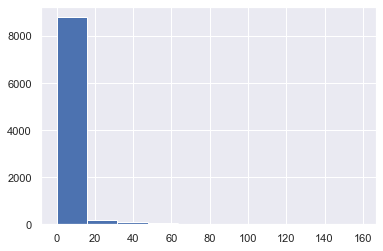

In [61]:
plt.hist(x='Discount', data=df_gabung)

In [62]:
df_gabung['Discount'].value_counts()

0.00      8619
15.00       23
8.00        21
10.00       21
22.00       19
          ... 
63.00        1
74.00        1
125.00       1
3.01         1
119.00       1
Name: Discount, Length: 108, dtype: int64

In [63]:
a = df_gabung[df_gabung['Promo']=='True']
a

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Love_Category,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category
id,,,,,,,,,,,,,,,,,,,,,
1046168,Armani Beauty,Cologne,Acqua di Gio Jumbo,with size,5.0,12,1700,126.0,198.0,https://www.sephora.com/product/acqua-for-life...,...,Cukup disukai,72.0,True,0,with details,no instructions,unknown,False,Sangat Mahal,Level 3
1140854,The Art of Shaving,Skincare Sets,The 4 Elements of the Perfect Shave™ - Unscented,no size,5.0,60,1500,95.0,137.0,https://www.sephora.com/product/the-4-elements...,...,Kurang disukai,42.0,True,0,with details,with intructions,with ingredients,False,Sangat Mahal,Level 1
1141183,The Art of Shaving,Skincare Sets,The 4 Elements of the Perfect Shave™ - Sandalwood,no size,5.0,38,2000,95.0,137.0,https://www.sephora.com/product/the-4-elements...,...,Cukup disukai,42.0,True,0,with details,with intructions,with ingredients,False,Sangat Mahal,Level 1
1176189,Jack Black,Shaving,Beard Lube Conditioning Shave - 3 Pack,with size,5.0,44,936,40.0,48.0,https://www.sephora.com/product/beard-lube-con...,...,Kurang disukai,8.0,True,0,with details,no instructions,with ingredients,False,Mahal,Level 2
1359298,Versace,Cologne,Pour Homme,with size,5.0,288,8300,115.0,158.0,https://www.sephora.com/product/pour-homme-P21...,...,Disukai,43.0,True,5,with details,no instructions,with ingredients,False,Sangat Mahal,Level 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357630,PLAY! by SEPHORA,Value & Gift Sets,PLAY! by Sephora: Beauty Soul Mates,no size,0.0,0,4600,10.0,30.0,https://www.sephora.com/product/play-brands-pl...,...,Cukup disukai,20.0,True,0,with details,no instructions,unknown,False,Cukup Mahal,Level 1
2359180,ghd,Hair Straighteners & Flat Irons,Cobalt Blue Platinum+ Styler Set - Upbeat Coll...,no size,0.0,0,57,249.0,279.0,https://www.sephora.com/product/ghd-cobalt-blu...,...,Kurang disukai,30.0,True,0,with details,no instructions,unknown,False,Sangat Mahal,Level 1
2359198,ghd,Hair Straighteners & Flat Irons,Silver Moon Gold Styler Set - Upbeat Collection,no size,0.0,0,50,199.0,229.0,https://www.sephora.com/product/ghd-silver-moo...,...,Kurang disukai,30.0,True,0,with details,no instructions,unknown,False,Sangat Mahal,Level 1


(array([212., 171.,  80.,  45.,  21.,   5.,   4.,   6.,   4.,   1.]),
 array([  2. ,  17.7,  33.4,  49.1,  64.8,  80.5,  96.2, 111.9, 127.6,
        143.3, 159. ]),
 <BarContainer object of 10 artists>)

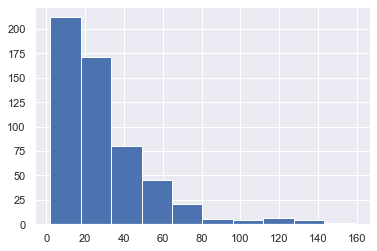

In [64]:
plt.hist(x='Discount', data=a)

In [65]:
a.describe()

,rating,number_of_reviews,love,price,value_price,exclusive,Count_Brand,Discount,jumlah_option
count,549.000000,549.000000,549.000000,549.000000,549.000000,321.000000,549.000000,549.000000,549.000000
mean,3.500000,79.954463,8296.819672,66.839690,96.236612,0.436137,68.828780,29.396922,0.045537
std,1.755596,467.447506,19627.018029,61.815345,75.676933,0.496679,89.634089,23.938184,0.426883
min,0.000000,0.000000,0.000000,10.000000,12.000000,0.000000,2.000000,2.000000,0.000000
25%,3.500000,1.000000,864.000000,29.000000,45.000000,0.000000,24.000000,13.000000,0.000000
50%,4.000000,5.000000,2600.000000,45.000000,75.000000,0.000000,46.000000,22.000000,0.000000
75%,4.500000,24.000000,7400.000000,80.000000,124.000000,1.000000,74.000000,39.000000,0.000000
max,5.000000,8000.000000,212200.000000,435.000000,504.000000,1.000000,496.000000,159.000000,5.000000


In [66]:
conditions = [
    (df_gabung['Discount'] == 0),
    (df_gabung['Discount'] > 0) & (df_gabung['Discount'] < 13),
    (df_gabung['Discount'] >= 13) & (df_gabung['Discount'] < 22),
    (df_gabung['Discount'] >= 22) & (df_gabung['Discount'] < 39),
    (df_gabung['Discount'] >= 39)
    ]

# create a list of the values we want to assign for each condition
values = [np.nan, 'Level 1', 'Level 2', 'Level 3', 'Level 4']

# create a new column and use np.select to assign values to it using our lists as arguments
df_gabung['Discount_Category'] = np.select(conditions, values)

# display updated DataFrame
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Discount,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category,Discount_Category
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,0.0,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan


In [67]:
df_gabung['Discount_Category'].value_counts()

nan        8619
Level 3     153
Level 4     138
Level 2     133
Level 1     125
Name: Discount_Category, dtype: int64

In [68]:
df_gabung['rating_new'] = np.where(df_gabung['rating'] == 0, np.nan, df_gabung['rating'])
df_gabung.head()

,brand,category,name,size,rating,number_of_reviews,love,price,value_price,URL,...,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category,Discount_Category,rating_new
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,Gift Card,no size,5.0,46,0,50.0,50.0,https://www.sephora.com/product/gift-card-P370...,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,5.0
304,SEPHORA COLLECTION,no category,Happy Birthday Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/happy-birthday...,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
404,SEPHORA COLLECTION,no category,Lips Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/lips-gift-card...,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
443,SEPHORA COLLECTION,no category,Thank You Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/thank-you-gift...,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
463,SEPHORA COLLECTION,no category,Heart Gift Card,no size,0.0,0,0,50.0,50.0,https://www.sephora.com/product/heart-gift-car...,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN


In [69]:
df_gabung['rating_new'].value_counts()

4.5    3527
4.0    2853
3.5    1051
5.0     872
3.0     308
2.5      88
2.0      39
1.0      23
1.5       9
Name: rating_new, dtype: int64

In [70]:
df_gabung.columns

Index(['brand', 'category', 'name', 'size', 'rating', 'number_of_reviews',
       'love', 'price', 'value_price', 'URL', 'MarketingFlags', 'options',
       'details', 'how_to_use', 'ingredients', 'exclusive', 'Count_Brand',
       'Rating_Category', 'number_of_reviews_Category', 'Love_Category',
       'Discount', 'Promo', 'jumlah_option', 'details_category',
       'how_to_use_category', 'ingredients_category', 'completeness',
       'Price_Category', 'Brand_Category', 'Discount_Category', 'rating_new'],
      dtype='object')

In [71]:
label = ['brand', 'category', 'size', 'rating', 'number_of_reviews',
       'love', 'price', 'value_price', 'MarketingFlags',
       'exclusive', 'Count_Brand',
       'Rating_Category', 'number_of_reviews_Category', 'Love_Category',
       'Discount', 'Promo', 'jumlah_option', 'details_category',
       'how_to_use_category', 'ingredients_category', 'completeness',
       'Price_Category', 'Brand_Category', 'Discount_Category', 'rating_new'] 
df_gabung2 = df_gabung[label] 
df_gabung2.head()

,brand,category,size,rating,number_of_reviews,love,price,value_price,MarketingFlags,exclusive,...,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category,Discount_Category,rating_new
id,,,,,,,,,,,,,,,,,,,,,
50,SEPHORA COLLECTION,no category,no size,5.0,46,0,50.0,50.0,False,0.0,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,5.0
304,SEPHORA COLLECTION,no category,no size,0.0,0,0,50.0,50.0,False,0.0,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
404,SEPHORA COLLECTION,no category,no size,0.0,0,0,50.0,50.0,False,0.0,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
443,SEPHORA COLLECTION,no category,no size,0.0,0,0,50.0,50.0,False,0.0,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN
463,SEPHORA COLLECTION,no category,no size,0.0,0,0,50.0,50.0,False,0.0,...,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan,NaN


In [72]:
df_gabung2.shape

(9168, 25)

In [73]:
df_gabung2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9168 entries, 50 to 2359685
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   brand                       9168 non-null   object 
 1   category                    9168 non-null   object 
 2   size                        9168 non-null   object 
 3   rating                      9168 non-null   float64
 4   number_of_reviews           9168 non-null   int64  
 5   love                        9168 non-null   int64  
 6   price                       9168 non-null   float64
 7   value_price                 9168 non-null   float64
 8   MarketingFlags              9168 non-null   bool   
 9   exclusive                   8000 non-null   float64
 10  Count_Brand                 9168 non-null   int64  
 11  Rating_Category             9168 non-null   object 
 12  number_of_reviews_Category  9168 non-null   object 
 13  Love_Category               9

In [74]:
df_gabung2['MarketingFlags'] = df_gabung2['MarketingFlags'].astype(object)

In [75]:
df_gabung2['completeness'] = df_gabung2['completeness'].astype(object)

In [76]:
df_gabung2['jumlah_option'] = df_gabung2['jumlah_option'].astype(object)

In [77]:
df_gabung2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9168 entries, 50 to 2359685
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   brand                       9168 non-null   object 
 1   category                    9168 non-null   object 
 2   size                        9168 non-null   object 
 3   rating                      9168 non-null   float64
 4   number_of_reviews           9168 non-null   int64  
 5   love                        9168 non-null   int64  
 6   price                       9168 non-null   float64
 7   value_price                 9168 non-null   float64
 8   MarketingFlags              9168 non-null   object 
 9   exclusive                   8000 non-null   float64
 10  Count_Brand                 9168 non-null   int64  
 11  Rating_Category             9168 non-null   object 
 12  number_of_reviews_Category  9168 non-null   object 
 13  Love_Category               9

In [78]:
train_fn2 = df_gabung.iloc[0:8000,:]
train_fn2.shape

(8000, 31)

# 6. Exploratory Data Analysis (EDA)

## 6.1 Correlation

<AxesSubplot:>

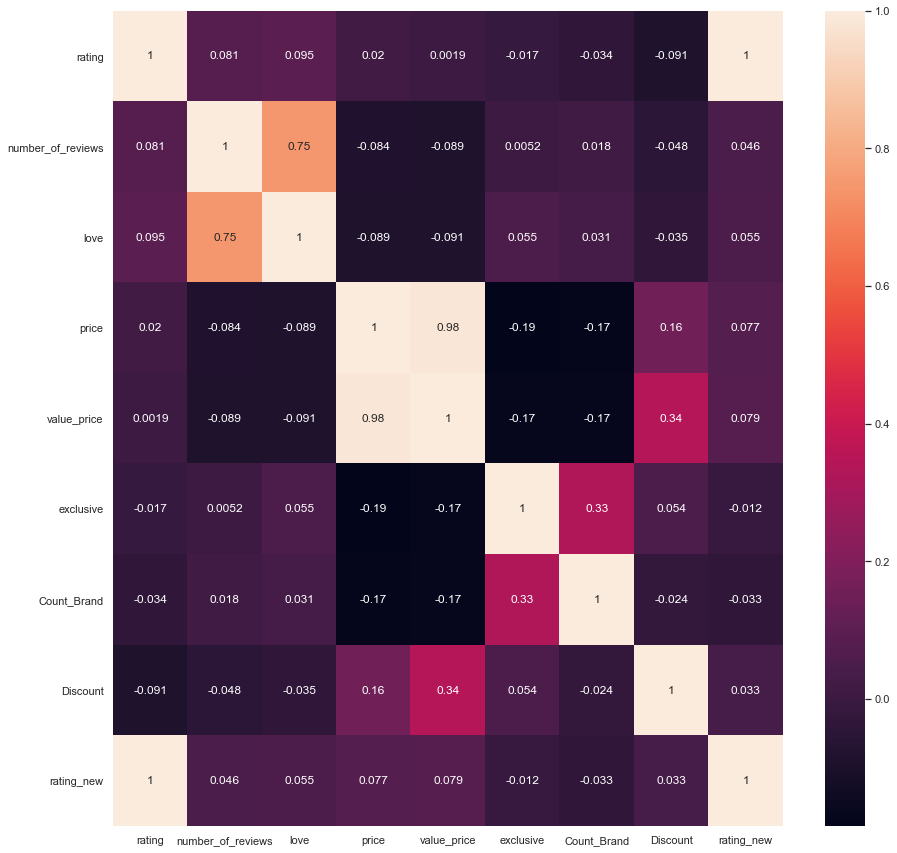

In [79]:
#Set figure size
plt.figure(figsize=(15,15))
#Create plot, annotation is True (show the score)
sns.heatmap(df_gabung2.corr(),annot=True)

<AxesSubplot:>

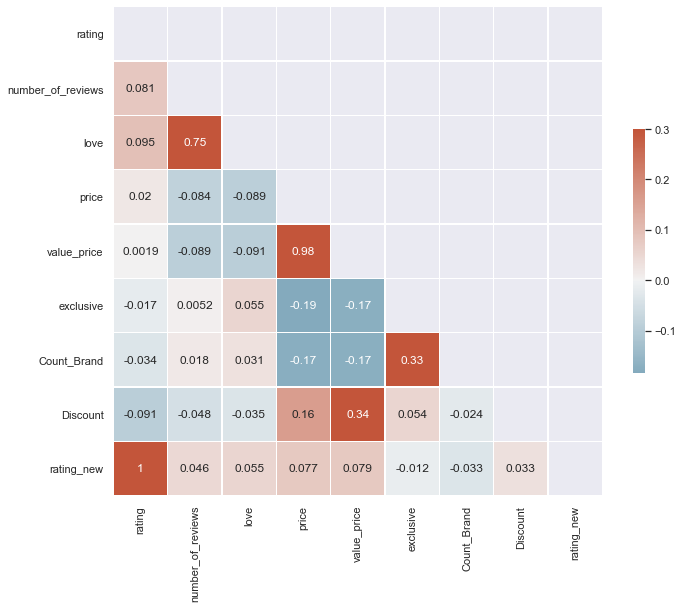

In [80]:
corr = df_gabung2.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

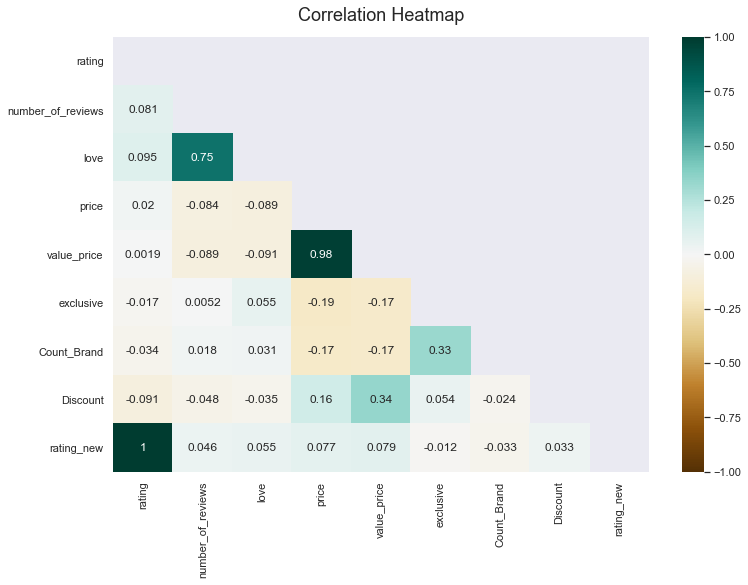

In [81]:
np.triu(np.ones_like(df_gabung2.corr()))
plt.figure(figsize=(12, 8))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df_gabung2.corr(), dtype=np.bool))
heatmap = sns.heatmap(df_gabung2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

In [82]:
from pandas_profiling import ProfileReport

In [83]:
ProfileReport(df_gabung2)

## 6.2 Distribution Analysis

In [84]:
"""
Define our countplot by modifying seaborn count plot

Function: showcountplot(plotuse,text=None,showtext=False)
          Require:
          - seaborn as sns
          
          Input:
          - plotuse  : pandas.series, it is used data. Default = No Default, should be filled.
          - text     : list, it is used to replace x labels on plot. Default = None
          - showtext : boolean, choice to show information of plot or not. Default = False
          
          Return:
          - Nothing
          
          Output:
          - Plot     : seaborn.countplot, count plot of data
          - Text     : string, additional information of data
"""
def showcountplot(plotuse,text=None,showtext = False):
    #Condition check #1:
    #If text is None/not typed on input, it is automatically set to null list
    if text==None:
        text = []
    #Condition check #2: 
    #If length of our text is not equal to unique value of our data and we want to show the text,
    #It will raise an error to insert an equal amount of text
    if len(text) != len(plotuse.unique()) and showtext == True:
        print(f"Length of text is {len(text)} while length of unique feature is {len(plotuse.unique())}")
        raise ValueError("Insert an equal amount text with the variable category")
    #Condition check #3:
    #If our unique value has more than 10, it is automatically set to None due to messy plot
    #elif len(plotuse.unique()) > 10:
    #    print(f"Warnings: Text is being shutdown due to messy plot result")
    #    text,showtext = [],False
    #Initialize
    plt.figure(figsize=(15,5))
    #Create seaborn count plot by ordering value_counts of data (The most value come first)
    ax = sns.countplot(plotuse,facecolor=(0, 0, 0, 0),
                       linewidth=1,
                       edgecolor=sns.color_palette("husl",4),
                       order = plotuse.value_counts().index)
    #Set a title
    ax.set_title(f"Count Plot of {plotuse.name}")
    #Create text and additional information
    for index,value in enumerate(plotuse.value_counts()):
        if text == []:
            ax.set_xticklabels("")
        else:
            ax.set_xticklabels(text,rotation=90) 
        if showtext:
            ax.text(index,value,value, color='black', ha="center")
            if text == []:
                print(f"The amount of {index} is {value}, which is {round(100.0*value/len(plotuse),2)}% of the {plotuse.name} variable")
            else:
                print(f"The amount of {text[index]} is {value}, which is {round(100.0*value/len(plotuse),2)}% of the {plotuse.name} variable")
        else:
            if text == []:
                ax.set_xticklabels("")
            else:
                ax.set_xticklabels(text) 
    #Show our plot
    plt.show()

"""
Define our complete statistics description. A deeper description may lead to better interpretation. 
We provide 13 statistical results: length, sum, minimum, 1st quantile, mean, median, 3rd quantile, 
standard deviation, maximum, interquantile range, range, skewness, and kurtosis.

Function: summarystat(x)
          Require:
          - statistics as stat
          - numpy as np
          
          Input:
          - x        : pandas.dataframe, it is used data. Default = No Default, should be filled.
          - roundval : integer, it is used to round our decimal limit. Default = 2
          
          Return:
          - summaryout: pandas.dataframe, it is our conclusion table
          
          Output:
          - Nothing
"""
def summarystat(x,roundval=2):
    #Condition check #1:
    if str(roundval).isdigit() != True:
        raise TypeError("Round value should be number")
    #Initialization
    S1 = np.zeros(0);Min1 = np.zeros(0);Q11 = np.zeros(0);Me1 = np.zeros(0);Med1 = np.zeros(0)
    Q31 = np.zeros(0);Std1 = np.zeros(0);Max1 = np.zeros(0);IQR1 = np.zeros(0);Rg1 = np.zeros(0)
    Sk1 = np.zeros(0);Kt1 = np.zeros(0);L1 = np.zeros(0)
    #Value loop
    for i in x.keys():
        L1 = np.append(L1,len(x[i].dropna()))
        S1 = np.append(S1,sum(x[i].dropna()))
        Min1 = np.append(Min1,min(x[i].dropna()))
        Q11 = np.append(Q11,x[i].dropna().quantile(0.25))
        Me1 = np.append(Me1,stat.mean(x[i].dropna()))
        Med1 = np.append(Med1,stat.median(x[i].dropna()))
        Q31 = np.append(Q31,x[i].dropna().quantile(0.75))
        Std1 = np.append(Std1,stat.stdev(x[i].dropna()))
        Max1 = np.append(Max1,max(x[i].dropna()))
        Sk1 = np.append(Sk1,x[i].dropna().skew())
        Kt1 = np.append(Kt1, x[i].dropna().kurtosis())
    for j in range(len(x.keys())):
        IQR1 = np.append(IQR1, Q31[j]-Q11[j])
        Rg1 = np.append(Rg1,Max1[j]-Min1[j])
    #Result
    summaryout=pd.DataFrame({'Length': L1,
                             'Sum': S1,
                             'Minimum': Min1,
                             '1st Quantile': Q11,
                             'Mean': Me1,
                             'Median': Med1,
                             '3rd Quantile': Q31,
                             'Stdev': Std1,
                             'Maximum': Max1,
                             'IQR': IQR1,
                             'Range':Rg1,
                             'Skewness':Sk1,
                             'Kurtosis':Kt1
                            })
    #Change columns name by keys
    summaryout.index=x.keys()
    #Return to our result
    return(round(summaryout,int(roundval)))

In [85]:
train_fn2.columns

Index(['brand', 'category', 'name', 'size', 'rating', 'number_of_reviews',
       'love', 'price', 'value_price', 'URL', 'MarketingFlags', 'options',
       'details', 'how_to_use', 'ingredients', 'exclusive', 'Count_Brand',
       'Rating_Category', 'number_of_reviews_Category', 'Love_Category',
       'Discount', 'Promo', 'jumlah_option', 'details_category',
       'how_to_use_category', 'ingredients_category', 'completeness',
       'Price_Category', 'Brand_Category', 'Discount_Category', 'rating_new'],
      dtype='object')

The amount of 0 is 5953, which is 74.41% of the exclusive variable
The amount of 1 is 2047, which is 25.59% of the exclusive variable


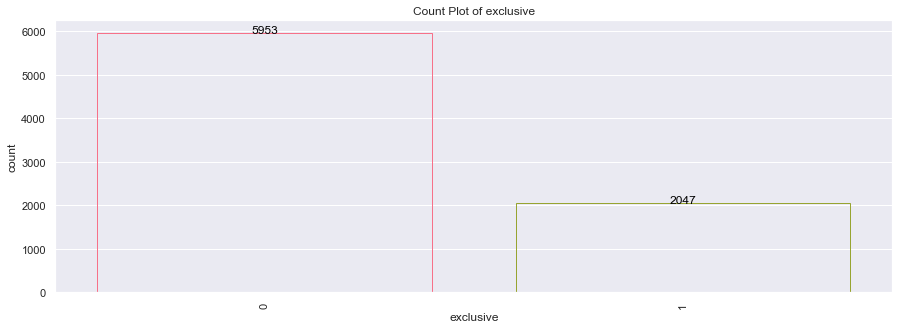

In [86]:
showcountplot(train_fn2.iloc[:,15], text=[0, 1],showtext=True)

## 6.3 Outlier Checking

<AxesSubplot:xlabel='rating'>

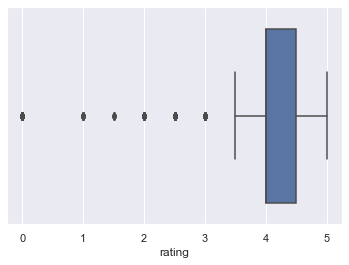

In [87]:
sns.boxplot(train_fn2['rating'])

<AxesSubplot:xlabel='number_of_reviews'>

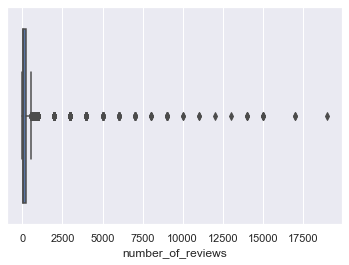

In [88]:
sns.boxplot(train_fn2['number_of_reviews'])

<AxesSubplot:xlabel='price'>

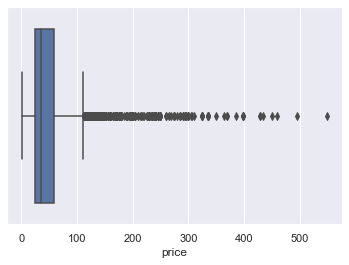

In [89]:
sns.boxplot(train_fn2['price'])

<AxesSubplot:xlabel='value_price'>

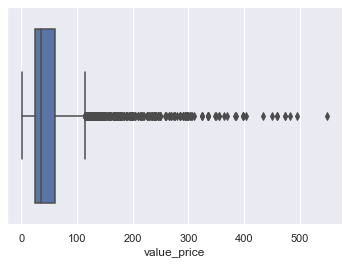

In [90]:
sns.boxplot(train_fn2['value_price'])

<AxesSubplot:xlabel='Count_Brand'>

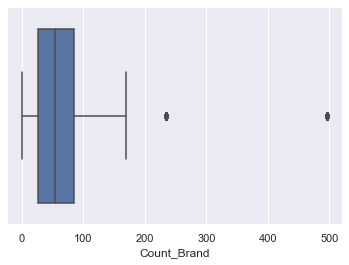

In [91]:
sns.boxplot(train_fn2['Count_Brand'])

<AxesSubplot:xlabel='Discount'>

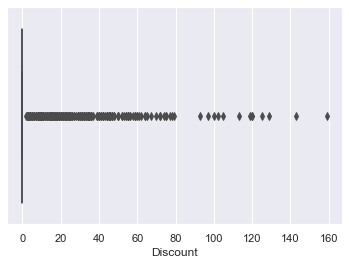

In [92]:
sns.boxplot(train_fn2['Discount'])

<AxesSubplot:xlabel='love'>

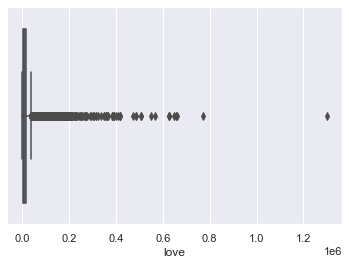

In [93]:
sns.boxplot(train_fn2['love'])

## 6.4 Numerical Categorical Split

In [94]:
df_gabung2.columns

Index(['brand', 'category', 'size', 'rating', 'number_of_reviews', 'love',
       'price', 'value_price', 'MarketingFlags', 'exclusive', 'Count_Brand',
       'Rating_Category', 'number_of_reviews_Category', 'Love_Category',
       'Discount', 'Promo', 'jumlah_option', 'details_category',
       'how_to_use_category', 'ingredients_category', 'completeness',
       'Price_Category', 'Brand_Category', 'Discount_Category', 'rating_new'],
      dtype='object')

In [95]:
df_gabung2.shape

(9168, 25)

In [96]:
label_num = ['rating', 'number_of_reviews', 'love','price', 'value_price', 'Count_Brand', 'Discount']
df_gabung2_num = df_gabung2[label_num]
df_gabung2_num.head()

,rating,number_of_reviews,love,price,value_price,Count_Brand,Discount
id,,,,,,,
50,5.0,46,0,50.0,50.0,496,0.0
304,0.0,0,0,50.0,50.0,496,0.0
404,0.0,0,0,50.0,50.0,496,0.0
443,0.0,0,0,50.0,50.0,496,0.0
463,0.0,0,0,50.0,50.0,496,0.0


In [97]:
label_cat = ['rating', 'number_of_reviews', 'love','price', 'value_price', 'Count_Brand', 'Discount', 'brand', 'rating_new']
df_gabung2_cat = df_gabung2.drop(label_cat, 1)
df_gabung2_cat.head()

,category,size,MarketingFlags,exclusive,Rating_Category,number_of_reviews_Category,Love_Category,Promo,jumlah_option,details_category,how_to_use_category,ingredients_category,completeness,Price_Category,Brand_Category,Discount_Category
id,,,,,,,,,,,,,,,,
50,no category,no size,False,0.0,Sangat bagus,banyak,Kurang disukai,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
304,no category,no size,False,0.0,Sangat tidak bagus,Kurang banyak,Kurang disukai,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
404,no category,no size,False,0.0,Sangat tidak bagus,Kurang banyak,Kurang disukai,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
443,no category,no size,False,0.0,Sangat tidak bagus,Kurang banyak,Kurang disukai,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan
463,no category,no size,False,0.0,Sangat tidak bagus,Kurang banyak,Kurang disukai,False,0,with details,no instructions,unknown,False,Mahal,Level 4,nan


## 6.5 Standardize

In [98]:
from sklearn.preprocessing import StandardScaler

In [99]:
#Create Scaler
scaler = StandardScaler()
#Apply scaler to new data frame
dfgabung_scaled = pd.DataFrame(np.array(scaler.fit_transform(df_gabung2_num)))
#Change columns name
dfgabung_scaled.columns = df_gabung2_num.keys()
dfgabung_scaled.head()

,rating,number_of_reviews,love,price,value_price,Count_Brand,Discount
0,1.002311,-0.265148,-0.382089,-0.001341,-0.036873,3.768091,-0.193338
1,-3.959721,-0.316799,-0.382089,-0.001341,-0.036873,3.768091,-0.193338
2,-3.959721,-0.316799,-0.382089,-0.001341,-0.036873,3.768091,-0.193338
3,-3.959721,-0.316799,-0.382089,-0.001341,-0.036873,3.768091,-0.193338
4,-3.959721,-0.316799,-0.382089,-0.001341,-0.036873,3.768091,-0.193338


In [100]:
dfgabung_scaled.shape

(9168, 7)

<AxesSubplot:>

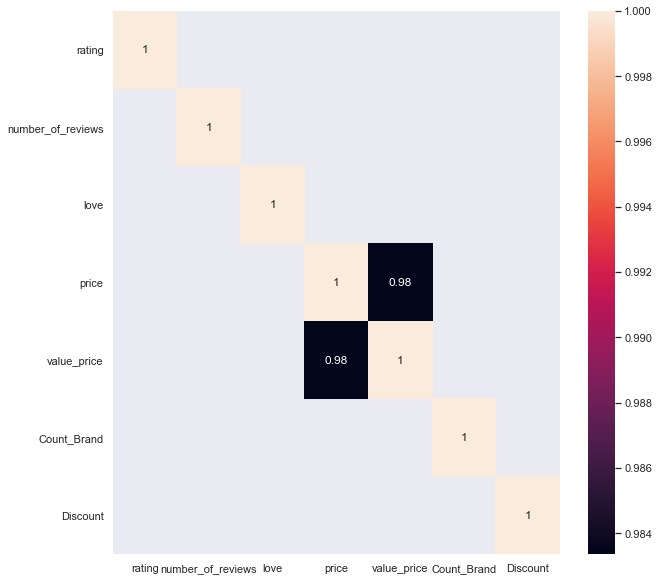

In [101]:
plt.figure(figsize=(10,10))
sns.heatmap(dfgabung_scaled.corr()[abs(dfgabung_scaled.corr())>0.75],annot=True)

<AxesSubplot:>

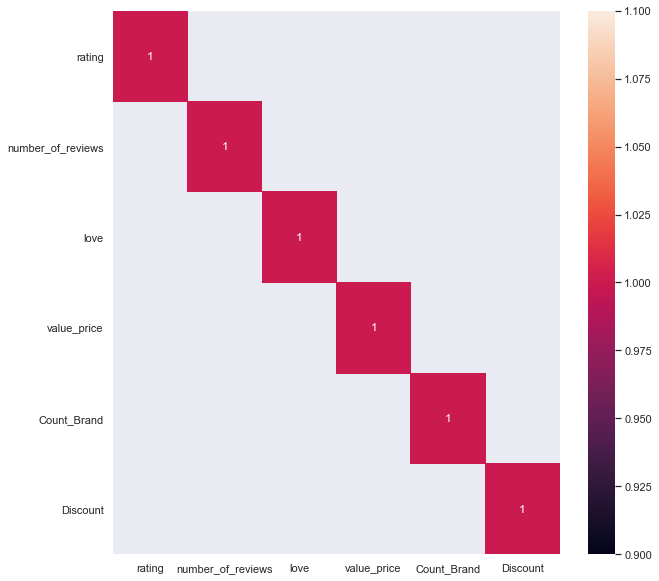

In [102]:
dfgabung_scaled = dfgabung_scaled.drop(["price"],axis=1)
#We plot again
plt.figure(figsize=(10,10))
sns.heatmap(dfgabung_scaled.corr()[dfgabung_scaled.corr()>abs(0.75)],annot=True)

## 6.6 Categorical Dummy

In [103]:
dfgabung_dum = pd.get_dummies(df_gabung2_cat)
dfgabung_dum.head()

,exclusive,category_Accessories,category_After Sun Care,category_Aftershave,category_Anti-Aging,category_BB & CC Cream,category_BB & CC Creams,category_Bath & Body,category_Bath & Shower,category_Bath Soaks & Bubble Bath,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
id,,,,,,,,,,,,,,,,,,,,,
50,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
304,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
404,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
443,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
463,0.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [104]:
dfgabung_dum.shape

(9168, 192)

In [105]:
dfgabung_dum = dfgabung_dum.reset_index()
dfgabung_dum.head()

,id,exclusive,category_Accessories,category_After Sun Care,category_Aftershave,category_Anti-Aging,category_BB & CC Cream,category_BB & CC Creams,category_Bath & Body,category_Bath & Shower,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
0,50,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
1,304,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
2,404,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
3,443,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
4,463,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


## 6.7 Combine Data

In [106]:
data = [dfgabung_scaled, dfgabung_dum]
dfgabung_new = pd.concat(data, axis=1)
dfgabung_new.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,id,exclusive,category_Accessories,category_After Sun Care,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
0,1.002311,-0.265148,-0.382089,-0.036873,3.768091,-0.193338,50,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
1,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,304,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
2,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,404,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
3,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,443,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
4,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,463,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [107]:
dfgabung_new.to_csv('dfgabung_new.csv')

In [108]:
train_fn = dfgabung_new.iloc[0:8000,:]
train_fn.shape

(8000, 199)

In [109]:
train_fn.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,id,exclusive,category_Accessories,category_After Sun Care,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
0,1.002311,-0.265148,-0.382089,-0.036873,3.768091,-0.193338,50,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
1,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,304,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
2,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,404,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
3,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,443,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1
4,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,463,0.0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [110]:
train_fn.columns

Index(['rating', 'number_of_reviews', 'love', 'value_price', 'Count_Brand',
       'Discount', 'id', 'exclusive', 'category_Accessories',
       'category_After Sun Care',
       ...
       'Price_Category_Sangat Mahal', 'Brand_Category_Level 1',
       'Brand_Category_Level 2', 'Brand_Category_Level 3',
       'Brand_Category_Level 4', 'Discount_Category_Level 1',
       'Discount_Category_Level 2', 'Discount_Category_Level 3',
       'Discount_Category_Level 4', 'Discount_Category_nan'],
      dtype='object', length=199)

In [111]:
train_fn = train_fn.set_index('id')
train_fn.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,exclusive,category_Accessories,category_After Sun Care,category_Aftershave,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
id,,,,,,,,,,,,,,,,,,,,,
50,1.002311,-0.265148,-0.382089,-0.036873,3.768091,-0.193338,0.0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
304,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0.0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
404,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0.0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
443,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0.0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
463,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0.0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [112]:
test_fn = dfgabung_new.iloc[8000:,:]
test_fn.shape

(1168, 199)

In [113]:
test_fn.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,id,exclusive,category_Accessories,category_After Sun Care,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
8000,-0.486299,-0.299956,-0.330451,-0.259291,0.082867,-0.193338,2294049,NaN,0,0,...,0,0,0,0,1,0,0,0,0,1
8001,0.009905,1.928895,0.390136,-0.562589,0.009711,-0.193338,2294312,NaN,0,0,...,0,0,0,0,1,0,0,0,0,1
8002,-3.959721,-0.316799,-0.377254,0.569723,-0.301201,-0.193338,2294346,NaN,0,0,...,1,0,1,0,0,0,0,0,0,1
8003,-3.959721,-0.316799,-0.376643,0.569723,-0.301201,-0.193338,2294353,NaN,0,0,...,1,0,1,0,0,0,0,0,0,1
8004,-3.959721,-0.316799,-0.378850,0.569723,-0.301201,-0.193338,2294361,NaN,0,0,...,1,0,1,0,0,0,0,0,0,1


In [114]:
test_fn.columns

Index(['rating', 'number_of_reviews', 'love', 'value_price', 'Count_Brand',
       'Discount', 'id', 'exclusive', 'category_Accessories',
       'category_After Sun Care',
       ...
       'Price_Category_Sangat Mahal', 'Brand_Category_Level 1',
       'Brand_Category_Level 2', 'Brand_Category_Level 3',
       'Brand_Category_Level 4', 'Discount_Category_Level 1',
       'Discount_Category_Level 2', 'Discount_Category_Level 3',
       'Discount_Category_Level 4', 'Discount_Category_nan'],
      dtype='object', length=199)

In [115]:
test_fn = test_fn.drop(['exclusive'], axis=1)
test_fn.columns

Index(['rating', 'number_of_reviews', 'love', 'value_price', 'Count_Brand',
       'Discount', 'id', 'category_Accessories', 'category_After Sun Care',
       'category_Aftershave',
       ...
       'Price_Category_Sangat Mahal', 'Brand_Category_Level 1',
       'Brand_Category_Level 2', 'Brand_Category_Level 3',
       'Brand_Category_Level 4', 'Discount_Category_Level 1',
       'Discount_Category_Level 2', 'Discount_Category_Level 3',
       'Discount_Category_Level 4', 'Discount_Category_nan'],
      dtype='object', length=198)

In [116]:
test_fn = test_fn.set_index('id')
test_fn.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,category_Accessories,category_After Sun Care,category_Aftershave,category_Anti-Aging,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
id,,,,,,,,,,,,,,,,,,,,,
2294049,-0.486299,-0.299956,-0.330451,-0.259291,0.082867,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
2294312,0.009905,1.928895,0.390136,-0.562589,0.009711,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
2294346,-3.959721,-0.316799,-0.377254,0.569723,-0.301201,-0.193338,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
2294353,-3.959721,-0.316799,-0.376643,0.569723,-0.301201,-0.193338,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1
2294361,-3.959721,-0.316799,-0.378850,0.569723,-0.301201,-0.193338,0,0,0,0,...,1,0,1,0,0,0,0,0,0,1


# 7. Dataset Preparation before Modeling

## 7.1 Balance Dataset

In [117]:
y = train_fn['exclusive']
X = train_fn.drop(['exclusive'], axis=1)

In [118]:
y.head()

id
50     0.0
304    0.0
404    0.0
443    0.0
463    0.0
Name: exclusive, dtype: float64

In [119]:
X.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,category_Accessories,category_After Sun Care,category_Aftershave,category_Anti-Aging,...,Price_Category_Sangat Mahal,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan
id,,,,,,,,,,,,,,,,,,,,,
50,1.002311,-0.265148,-0.382089,-0.036873,3.768091,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
304,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
404,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
443,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
463,-3.959721,-0.316799,-0.382089,-0.036873,3.768091,-0.193338,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [120]:
#Combine
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, EditedNearestNeighbours
from imblearn.combine import SMOTEENN, SMOTETomek
#Undersampling
enn = EditedNearestNeighbours()
tl = TomekLinks()
rus = RandomUnderSampler()
st = SMOTETomek()
se = SMOTEENN()

In [121]:
%%time
X_enn, y_enn = enn.fit_resample(X, y)
X_tl, y_tl = tl.fit_resample(X, y)
X_rus, y_rus = rus.fit_resample(X, y)
X_st, y_st = st.fit_resample(X, y)
X_se, y_se = se.fit_resample(X, y)

Wall time: 39.1 s


In [122]:
print("Sebelum Undersampmling")
print("="*75)
print(f"Shape dari y: {len(y)}, dimana jumlah 'exclusive': {sum(y)}, dan 'non exclusive': {len(y)-sum(y)}")
print("="*75)
print(f"Setelah Undersampling")
print("="*75)
print("ENN")
print(f"Shape dari y: {len(y_enn)}, dimana jumlah 'exclusive': {sum(y_enn)}, dan 'non exclusive': {len(y_enn)-sum(y_enn)}")
print("="*75)
print("Tomek Links")
print(f"Shape dari y: {len(y_tl)}, dimana jumlah 'exclusive': {sum(y_tl)}, dan 'non exclusive': {len(y_tl)-sum(y_tl)}")
print("="*75)
print("Random Under Sampling")
print(f"Shape dari y: {len(y_rus)}, dimana jumlah 'exclusive': {sum(y_rus)}, dan 'non exclusive': {len(y_rus)-sum(y_rus)}")
print("="*75)
print("SMOTE + TomekLinks")
print(f"Shape dari y: {len(y_st)}, dimana jumlah 'exclusive': {sum(y_st)}, dan 'non exclusive': {len(y_st)-sum(y_st)}")
print("="*75)
print("SMOTE + ENN")
print(f"Shape dari y: {len(y_se)}, dimana jumlah 'exclusive': {sum(y_se)}, dan 'non exclusive': {len(y_se)-sum(y_se)}")
print("="*75)

Sebelum Undersampmling
Shape dari y: 8000, dimana jumlah 'exclusive': 2047.0, dan 'non exclusive': 5953.0
Setelah Undersampling
ENN
Shape dari y: 6886, dimana jumlah 'exclusive': 2047.0, dan 'non exclusive': 4839.0
Tomek Links
Shape dari y: 7795, dimana jumlah 'exclusive': 2047.0, dan 'non exclusive': 5748.0
Random Under Sampling
Shape dari y: 4094, dimana jumlah 'exclusive': 2047.0, dan 'non exclusive': 2047.0
SMOTE + TomekLinks
Shape dari y: 11816, dimana jumlah 'exclusive': 5908.0, dan 'non exclusive': 5908.0
SMOTE + ENN
Shape dari y: 10125, dimana jumlah 'exclusive': 5527.0, dan 'non exclusive': 4598.0


## 7.2 Train and Test Data Split

In [123]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_st,y_st,test_size=0.3)
X_train_std, X_test_std, y_train_std, y_test_std = train_test_split(X,y,test_size=0.3)

## 7.3 Comparing The Result of Balanced dan Unbalanced Data

### 7.3.1 The result for Unbalanced Data

In [124]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import accuracy_score,roc_auc_score,precision_score,recall_score,f1_score,log_loss
from sklearn.metrics import confusion_matrix, classification_report

In [125]:
def train_predict(learner,X_train,y_train,X_test,y_test):
    '''
    inputs:
        - learner: the learning algorithm to be trained and predicted on
        - X_train: features training set 
        - y_train: target training set
        - X_test: features testing set
        - y_test: target testing set
    '''
    results={}
    #Transform to numpy
    X_train,X_test= np.array(X_train),np.array(X_test)
    #Fit the learner to the training data using slicing with 'sample_size' using .fit
    learner = learner.fit(X_train,y_train)
    
    #Get the predictions on the test set(X_test),
    #then get predictions on the training samples(X_train) using .predict
    predictions_train = learner.predict(X_train)
    predictions_test = learner.predict(X_test)
    
    #Compute accuracy
    results['accuracy_score'] = accuracy_score(y_test,predictions_test)
    results['roc_auc_score'] = roc_auc_score(y_test,predictions_test)
    results['precision_score'] = precision_score(y_test,predictions_test)
    results['recall_score'] = recall_score(y_test,predictions_test)
    results['f1_score'] = f1_score(y_test,predictions_test)
    results['log_loss'] = log_loss(y_test,predictions_test)

    #Return the results
    return results

In [126]:
#Initialize the classifier model
clf_A = GaussianNB()
clf_B = SVC(random_state=0)
clf_C = RandomForestClassifier(random_state=0)
clf_D = LogisticRegression()
clf_E = DecisionTreeClassifier(random_state=0)
clf_F = BaggingClassifier(random_state=0,base_estimator=clf_C)
clf_G = GradientBoostingClassifier(random_state=0)
clf_H = AdaBoostClassifier(random_state=0,base_estimator=clf_C)
clf_I = KNeighborsClassifier()
clf_J = MLPClassifier()
clf_var = ["clf_A","clf_B","clf_C","clf_D","clf_E","clf_F","clf_G","clf_H","clf_I","clf_J"]
clf_list = [clf_A,clf_B,clf_C,clf_D,clf_E,clf_F,clf_G,clf_H,clf_I,clf_J]

In [127]:
%%time
results = {}
for clf in clf_list:
    clf_name = clf.__class__.__name__
    if clf_name is not "SVC":
        results[clf_name] = train_predict(clf,X_train_std,y_train_std,X_test_std,y_test_std)
        print(f"Done on {clf_name}")

Done on GaussianNB
Done on RandomForestClassifier
Done on LogisticRegression
Done on DecisionTreeClassifier
Done on BaggingClassifier
Done on GradientBoostingClassifier
Done on AdaBoostClassifier
Done on KNeighborsClassifier
Done on MLPClassifier
Wall time: 37.1 s


In [128]:
from prettytable import PrettyTable
tb_non_balanced = PrettyTable(["Category name","Accuracy Score","ROC AUC Score","Precision", "Recall", "F1 Score", "Log Los"])
for clf in clf_list:
    clf_name = clf.__class__.__name__
    if clf_name is not "SVC":
        a_accuracy_score = round(results[clf_name]["accuracy_score"],5)
        a_roc_auc = round(results[clf_name]["roc_auc_score"],5)
        a_precision = round(results[clf_name]["precision_score"],5)
        a_recall = round(results[clf_name]["recall_score"],5)
        a_f1_score = round(results[clf_name]["f1_score"],5)
        a_log_loss = round(results[clf_name]["log_loss"],5)
        tb_non_balanced.add_row([clf_name,a_accuracy_score,a_roc_auc,a_precision,a_recall,a_f1_score,a_log_loss])
print(tb_non_balanced)

+----------------------------+----------------+---------------+-----------+---------+----------+---------+
|       Category name        | Accuracy Score | ROC AUC Score | Precision |  Recall | F1 Score | Log Los |
+----------------------------+----------------+---------------+-----------+---------+----------+---------+
|         GaussianNB         |     0.8325     |     0.8687    |  0.61409  | 0.94346 | 0.74395  | 5.78537 |
|   RandomForestClassifier   |     0.9175     |    0.88644    |   0.8526  | 0.82229 | 0.83717  | 2.84948 |
|     LogisticRegression     |    0.89792     |    0.86429    |  0.80656  | 0.79483 | 0.80065  | 3.52587 |
|   DecisionTreeClassifier   |    0.89042     |    0.85344    |  0.79373  | 0.77706 | 0.78531  | 3.78492 |
|     BaggingClassifier      |    0.91917     |    0.88862    |  0.85595  | 0.82553 | 0.84046  | 2.79191 |
| GradientBoostingClassifier |    0.90333     |    0.86846    |  0.82304  | 0.79645 | 0.80952  | 3.33878 |
|     AdaBoostClassifier     |    0.9

### 7.3.2 The result for balanced Data

In [129]:
#Initialize the classifier model
clf_A = GaussianNB()
clf_B = SVC(random_state=0)
clf_C = RandomForestClassifier(random_state=0)
clf_D = LogisticRegression()
clf_E = DecisionTreeClassifier(random_state=0)
clf_F = BaggingClassifier(random_state=0,base_estimator=clf_C)
clf_G = GradientBoostingClassifier(random_state=0)
clf_H = AdaBoostClassifier(random_state=0,base_estimator=clf_C)
clf_I = KNeighborsClassifier()
clf_J = MLPClassifier()
clf_var = ["clf_A","clf_B","clf_C","clf_D","clf_E","clf_F","clf_G","clf_H","clf_I","clf_J"]
clf_list = [clf_A,clf_B,clf_C,clf_D,clf_E,clf_F,clf_G,clf_H,clf_I,clf_J]

In [130]:
%%time
results = {}
for clf in clf_list:
    clf_name = clf.__class__.__name__
    if clf_name is not "SVC":
        results[clf_name] = train_predict(clf,X_train,y_train,X_test,y_test)
        print(f"Done on {clf_name}")

Done on GaussianNB
Done on RandomForestClassifier
Done on LogisticRegression
Done on DecisionTreeClassifier
Done on BaggingClassifier
Done on GradientBoostingClassifier
Done on AdaBoostClassifier
Done on KNeighborsClassifier
Done on MLPClassifier
Wall time: 1min 5s


In [131]:
from prettytable import PrettyTable
tb_balanced = PrettyTable(["Category name","Accuracy Score","ROC AUC Score","Precision", "Recall", "F1 Score", "Log Los"])
for clf in clf_list:
    clf_name = clf.__class__.__name__
    if clf_name is not "SVC":
        a_accuracy_score = round(results[clf_name]["accuracy_score"],5)
        a_roc_auc = round(results[clf_name]["roc_auc_score"],5)
        a_precision = round(results[clf_name]["precision_score"],5)
        a_recall = round(results[clf_name]["recall_score"],5)
        a_f1_score = round(results[clf_name]["f1_score"],5)
        a_log_loss = round(results[clf_name]["log_loss"],5)
        tb_balanced.add_row([clf_name,a_accuracy_score,a_roc_auc,a_precision,a_recall,a_f1_score,a_log_loss])
print(tb_balanced)

+----------------------------+----------------+---------------+-----------+---------+----------+---------+
|       Category name        | Accuracy Score | ROC AUC Score | Precision |  Recall | F1 Score | Log Los |
+----------------------------+----------------+---------------+-----------+---------+----------+---------+
|         GaussianNB         |    0.88575     |    0.88503    |  0.83592  | 0.96255 | 0.89478  | 3.94597 |
|   RandomForestClassifier   |    0.93766     |    0.93722    |  0.90123  | 0.98435 | 0.94096  | 2.15324 |
|     LogisticRegression     |    0.91932     |    0.91895    |  0.88958  |  0.9592 | 0.92308  | 2.78653 |
|   DecisionTreeClassifier   |    0.91481     |    0.91472    |  0.90874  | 0.92398 |  0.9163  | 2.94241 |
|     BaggingClassifier      |    0.93004     |    0.92949    |  0.88583  | 0.98882 |  0.9345  |  2.4163 |
| GradientBoostingClassifier |    0.90296     |    0.90231    |  0.85504  | 0.97261 | 0.91004  | 3.35164 |
|     AdaBoostClassifier     |    0.9

From the result that we get, we finally choose three machine algorithms namely Random Forest Classifier, Xgboost, and Lightgbm that have good accuracy score and ROC AUC score.

## 7.4 Feature Selection

In [132]:
import sklearn
import xgboost as xg
import lightgbm as lgb
import catboost as cb

In [133]:
seed = 123
estimators = []
#We define our X and y variables
#X_train,y_train = train_data.iloc[:,1:],train_data.iloc[:,0]
#X_test,y_test = test_data.iloc[:,1:],test_data.iloc[:,0]
#Create our classifier
clf_A = RandomForestClassifier()
clf_B = xg.XGBClassifier()
clf_C = lgb.LGBMClassifier(silent=True)
clf_D = cb.CatBoostClassifier(verbose=False)
clf_total = {"Random Forest Classifier":clf_A,
             "XGB Classifier":clf_B,
             "Light GBM Classifier":clf_C,
             "CatBoost Classifier":clf_D}
for name,value in clf_total.items():
    estimators.append((name,value))

As we define our purpose, pretty table would be beneficial to show the result of our analysis.

In [134]:
def importance_table(importances,limit=10):
    index = np.argsort(importances)
    t = PrettyTable(["Category name","Feature Importances","Score"])
    for i in range(limit):
        t.add_row([X_train.keys()[index][len(importances)-limit:][limit-i-1],
                  importances[index][len(importances)-limit:][limit-i-1],
                  limit-i])
    print(t)
    return t

### 7.4.1 Random Forest Classifier

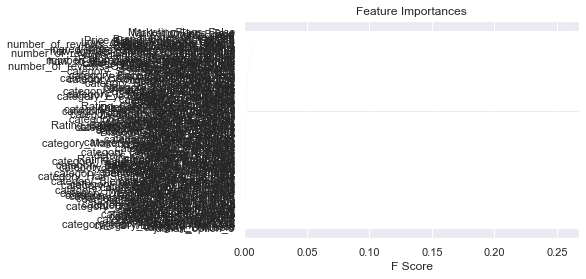

+------------------------------------------+-----------------------+-------+
|              Category name               |  Feature Importances  | Score |
+------------------------------------------+-----------------------+-------+
|           MarketingFlags_False           |  0.25509540784051055  |   15  |
|           MarketingFlags_True            |  0.23286277742037745  |   14  |
|               Count_Brand                |  0.07672512250606787  |   13  |
|               value_price                |  0.049633568637247175 |   12  |
|                   love                   |  0.041420912109204386 |   11  |
|            number_of_reviews             |  0.038302917855407355 |   10  |
|                  rating                  |  0.020622474318746552 |   9   |
|          Brand_Category_Level 3          |  0.016971799449808523 |   8   |
|       Price_Category_Sangat Mahal        |  0.011600738128319608 |   7   |
|          Brand_Category_Level 4          |  0.00990471570116166  |   6   |

In [135]:
#We fit our Classifier Model
clf_A.fit(X_train,y_train)
#Extract feature importances
importances = clf_A.feature_importances_
#Index of importances
index = np.argsort(importances)
#Create Plot
plt.title("Feature Importances")
plt.barh(range(len(index)), importances[index], color='b', align='center')
plt.yticks(range(len(index)), X_train.keys()[index])
plt.xlabel("F Score")
plt.show()

#Additional Table
importance_table(importances,limit=15)

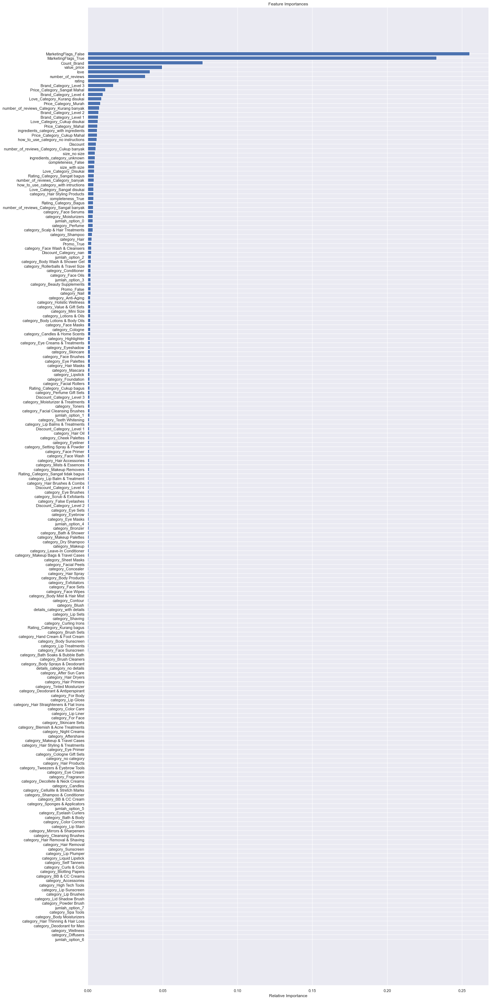

In [136]:
importances = clf_A.feature_importances_
indices = np.argsort(importances)
features=X_train.columns
plt.figure(figsize=(20,50))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')
plt.savefig('filename.png', dpi=300)

### 7.4.2 XGBoost Classifier

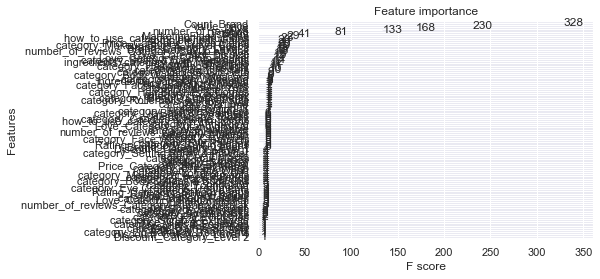

+------------------------------------------+---------------------+-------+
|              Category name               | Feature Importances | Score |
+------------------------------------------+---------------------+-------+
|           MarketingFlags_False           |      0.5196997      |   15  |
| number_of_reviews_Category_Kurang banyak |      0.08175323     |   14  |
|          Brand_Category_Level 1          |      0.01081203     |   13  |
|    category_Rollerballs & Travel Size    |     0.009975874     |   12  |
|           category_Anti-Aging            |     0.009705739     |   11  |
|               Count_Brand                |     0.008739661     |   10  |
|                   love                   |     0.008431974     |   9   |
|     category_Scalp & Hair Treatments     |     0.0077369804    |   8   |
|           category_Face Serums           |     0.007722967     |   7   |
|      category_Hair Styling Products      |     0.007527176     |   6   |
|              category_H

In [137]:
#We fit our Classifier Model
clf_B.fit(X_train, y_train)
#Create plot
xg.plot_importance(clf_B)
plt.show()

#Additional Table
importance_table(clf_B.feature_importances_,limit=15)

In [138]:
from xgboost import plot_importance, plot_tree

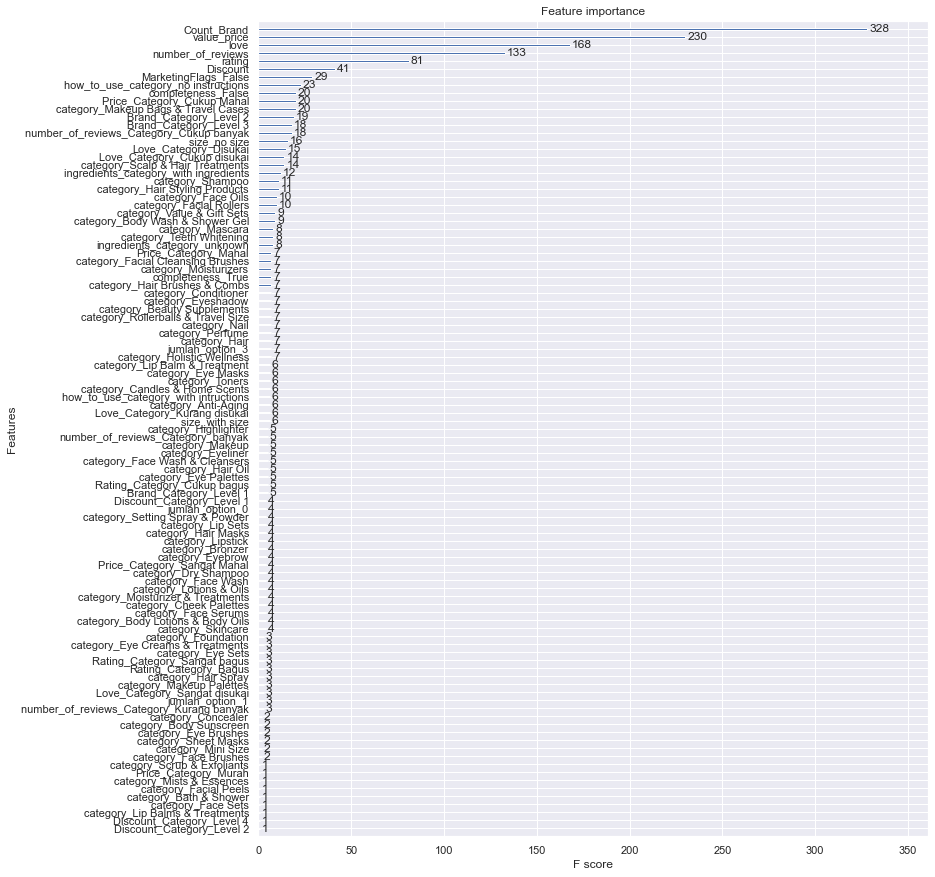

In [139]:
a = plot_importance(clf_B.fit(X_train, y_train))
fig = a.figure
fig.set_size_inches(12, 15)

### 7.4.3 Light GBM Classifier

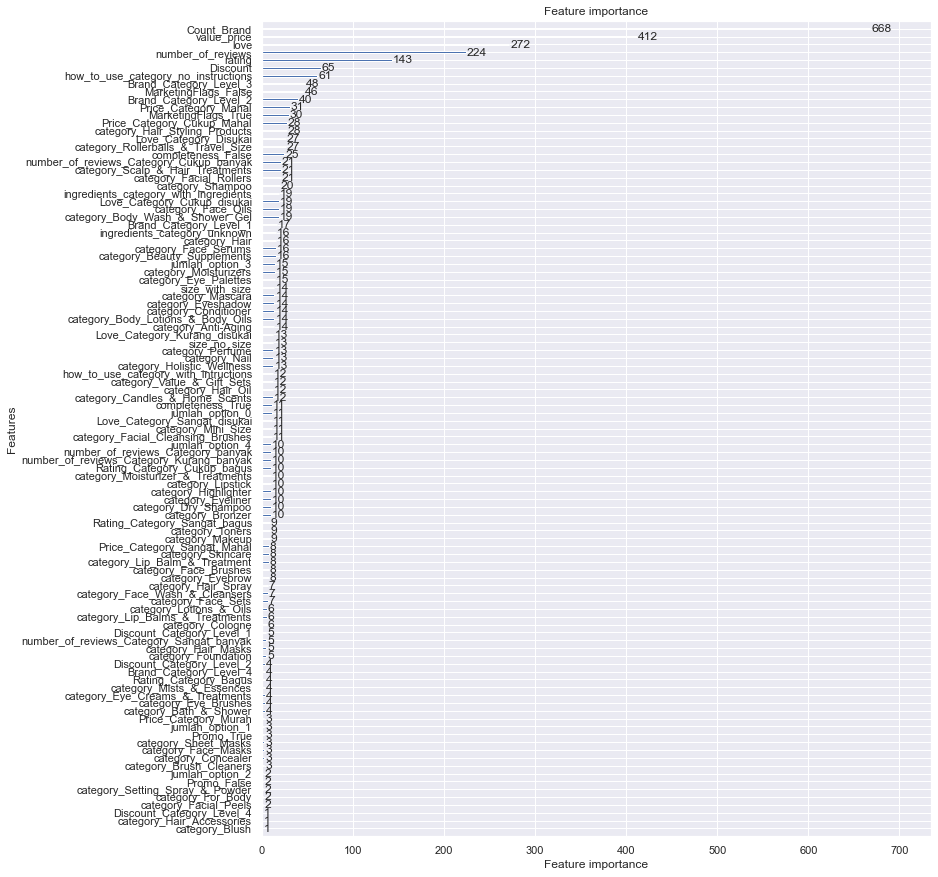

+-------------------------------------+---------------------+-------+
|            Category name            | Feature Importances | Score |
+-------------------------------------+---------------------+-------+
|             Count_Brand             |         668         |   15  |
|             value_price             |         412         |   14  |
|                 love                |         272         |   13  |
|          number_of_reviews          |         224         |   12  |
|                rating               |         143         |   11  |
|               Discount              |          65         |   10  |
| how_to_use_category_no instructions |          61         |   9   |
|        Brand_Category_Level 3       |          48         |   8   |
|         MarketingFlags_False        |          46         |   7   |
|        Brand_Category_Level 2       |          40         |   6   |
|         Price_Category_Mahal        |          31         |   5   |
|         MarketingF

In [140]:
#We fit our Classifier Model
clf_C.fit(X_train, y_train)
#Create Plot
b = lgb.plot_importance(clf_C)
fig = b.figure
fig.set_size_inches(12, 15)
plt.show()

#Additional Table
importance_table(clf_C.feature_importances_,limit=15)

# 8. Modeling Phase

In [141]:
def train_predict(learner,sample_size,X_train,y_train,X_test,y_test):
    '''
    inputs:
        - learner: the learning algorithm to be trained and predicted on
        - sample_size: the size of samples (number) to be drawn from training set
        - X_train: features training set 
        - y_train: target training set
        - X_test: features testing set
        - y_test: target testing set
    '''
    results={}
    #Transform to numpy
    X_train,X_test= np.array(X_train),np.array(X_test)
    #Fit the learner to the training data using slicing with 'sample_size' using .fit
    learner = learner.fit(X_train[:sample_size],y_train[:sample_size])
    
    #Get the predictions on the test set(X_test),
    #then get predictions on the training samples(X_train) using .predict
    predictions_train = learner.predict(X_train[:sample_size])
    predictions_test = learner.predict(X_test)
    
    #Compute accuracy on the training samples which is y_train
    results['acc_train'] = accuracy_score(y_train[:sample_size],predictions_train)
    
    #Compute accuracy on test set using accuracy_score()
    results['acc_test'] = accuracy_score(y_test,predictions_test)
    
    #Success
    print("{} trained on {} samples.".format(learner.__class__.__name__,sample_size))
    
    
    #Return the results
    return results

In [142]:
#Initialize the classifier model
clf_A = GaussianNB()
clf_B = SVC(random_state=0)
clf_C = RandomForestClassifier(random_state=0)
clf_D = LogisticRegression()
clf_E = DecisionTreeClassifier(random_state=0)
clf_F = BaggingClassifier(random_state=0,base_estimator=clf_C)
clf_G = GradientBoostingClassifier(random_state=0)
clf_H = AdaBoostClassifier(random_state=0,base_estimator=clf_C)
clf_I = KNeighborsClassifier()
clf_J = xg.XGBClassifier()
clf_K = lgb.LGBMClassifier(silent=True)
clf_var = ["clf_A","clf_B","clf_C","clf_D","clf_E","clf_F","clf_G","clf_H","clf_I","clf_J",
          "clf_K"]
clf_list = [clf_A,clf_B,clf_C,clf_D,clf_E,clf_F,clf_G,clf_H,clf_I,clf_J,clf_K]

#Calculate the number of samples for 100% of the training data
samples_100 = int(len(X_train)/1)

# 9. Testing Phase

In [143]:
%%time
results = {}
for clf in clf_list:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    for i,samples in enumerate([samples_100]):
        results[clf_name][i] = train_predict(clf,samples,X_train,y_train,X_test,y_test)

GaussianNB trained on 8271 samples.
SVC trained on 8271 samples.
RandomForestClassifier trained on 8271 samples.
LogisticRegression trained on 8271 samples.
DecisionTreeClassifier trained on 8271 samples.
BaggingClassifier trained on 8271 samples.
GradientBoostingClassifier trained on 8271 samples.
AdaBoostClassifier trained on 8271 samples.
KNeighborsClassifier trained on 8271 samples.
XGBClassifier trained on 8271 samples.
LGBMClassifier trained on 8271 samples.
Wall time: 49.3 s


In [144]:
tb = PrettyTable(["Category name","Train Accuracy","Test Accuracy"])
for clf in clf_list:
    clf_name = clf.__class__.__name__
    tb.add_row([clf_name,
               results[clf_name][0]["acc_train"],
               results[clf_name][0]["acc_test"]])
print(tb)

+----------------------------+--------------------+--------------------+
|       Category name        |   Train Accuracy   |   Test Accuracy    |
+----------------------------+--------------------+--------------------+
|         GaussianNB         | 0.8991657598839318 | 0.8857545839210155 |
|            SVC             | 0.9319308427034216 | 0.9139633286318759 |
|   RandomForestClassifier   |        1.0         | 0.9376586741889986 |
|     LogisticRegression     | 0.9331398863498972 | 0.9193229901269393 |
|   DecisionTreeClassifier   |        1.0         | 0.9148095909732017 |
|     BaggingClassifier      | 0.9906903639221376 | 0.9300423131170663 |
| GradientBoostingClassifier | 0.9283037117639947 | 0.9029619181946403 |
|     AdaBoostClassifier     |        1.0         | 0.9382228490832158 |
|    KNeighborsClassifier    | 0.9310845121508886 | 0.9015514809590973 |
|       XGBClassifier        | 0.9863378067948253 | 0.941607898448519  |
|       LGBMClassifier       | 0.9848869544190545 |

### We use the top 10 Feature

In [145]:
best_features = ['MarketingFlags_False', 'Brand_Category_Level 3', 'Count_Brand', 'love', 'Discount', 'value_price', 
                 'ingredients_category_with ingredients', 'rating', 'number_of_reviews', 'Brand_Category_Level 1'
]
X_train2,X_test2 = X_train[best_features],X_test[best_features]

In [146]:
#Initialize the classifier model
clf_A = GaussianNB()
clf_B = SVC(random_state=0)
clf_C = RandomForestClassifier(random_state=0)
clf_D = LogisticRegression()
clf_E = DecisionTreeClassifier(random_state=0)
clf_F = BaggingClassifier(random_state=0,base_estimator=clf_C)
clf_G = GradientBoostingClassifier(random_state=0)
clf_H = AdaBoostClassifier(random_state=0,base_estimator=clf_C)
clf_I = KNeighborsClassifier()
clf_J = xg.XGBClassifier()
clf_K = lgb.LGBMClassifier(silent=True)
clf_var = ["clf_A","clf_B","clf_C","clf_D","clf_E","clf_F","clf_G","clf_H","clf_I","clf_J",
          "clf_K"]
clf_list = [clf_A,clf_B,clf_C,clf_D,clf_E,clf_F,clf_G,clf_H,clf_I,clf_J,clf_K]

#Calculate the number of samples for 100% of the training data
samples_100 = int(len(X_train2)/1)

In [147]:
%%time
results = {}
for clf in clf_list:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    for i,samples in enumerate([samples_100]):
        results[clf_name][i] = train_predict(clf,samples,X_train2,y_train,X_test2,y_test)

GaussianNB trained on 8271 samples.
SVC trained on 8271 samples.
RandomForestClassifier trained on 8271 samples.
LogisticRegression trained on 8271 samples.
DecisionTreeClassifier trained on 8271 samples.
BaggingClassifier trained on 8271 samples.
GradientBoostingClassifier trained on 8271 samples.
AdaBoostClassifier trained on 8271 samples.
KNeighborsClassifier trained on 8271 samples.
XGBClassifier trained on 8271 samples.
LGBMClassifier trained on 8271 samples.
Wall time: 12.6 s


In [148]:
tb = PrettyTable(["Category name","Train Accuracy","Test Accuracy"])
for clf in clf_list:
    clf_name = clf.__class__.__name__
    tb.add_row([clf_name,
               results[clf_name][0]["acc_train"],
               results[clf_name][0]["acc_test"]])
print(tb)

+----------------------------+--------------------+--------------------+
|       Category name        |   Train Accuracy   |   Test Accuracy    |
+----------------------------+--------------------+--------------------+
|         GaussianNB         | 0.8772820698827227 | 0.8710860366713681 |
|            SVC             | 0.8851408535848144 | 0.8781382228490832 |
|   RandomForestClassifier   |        1.0         | 0.9325811001410437 |
|     LogisticRegression     | 0.8813928182807399 | 0.8744710860366713 |
|   DecisionTreeClassifier   |        1.0         | 0.9052186177715091 |
|     BaggingClassifier      | 0.9896022246403096 | 0.9300423131170663 |
| GradientBoostingClassifier | 0.9249183895538629 | 0.9077574047954866 |
|     AdaBoostClassifier     |        1.0         | 0.9328631875881523 |
|    KNeighborsClassifier    | 0.9328980776206021 | 0.9015514809590973 |
|       XGBClassifier        | 0.991415790110023  | 0.9435825105782792 |
|       LGBMClassifier       | 0.9785999274573812 |

# LGBM Modelling

In [149]:
def print_confusion_matrix(confusion_matrix, class_names, figsize = (10,7), fontsize=14):
    """Prints a confusion matrix, as returned by sklearn.metrics.confusion_matrix, as a heatmap.
    
    Arguments
    ---------
    confusion_matrix: numpy.ndarray
        The numpy.ndarray object returned from a call to sklearn.metrics.confusion_matrix. 
        Similarly constructed ndarrays can also be used.
    class_names: list
        An ordered list of class names, in the order they index the given confusion matrix.
    figsize: tuple
        A 2-long tuple, the first value determining the horizontal size of the ouputted figure,
        the second determining the vertical size. Defaults to (10,7).
    fontsize: int
        Font size for axes labels. Defaults to 14.
        
    Returns
    -------
    matplotlib.figure.Figure
        The resulting confusion matrix figure
    """
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names, 
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return fig

              precision    recall  f1-score   support

         0.0       0.96      0.91      0.93      1756
         1.0       0.91      0.96      0.94      1789

    accuracy                           0.94      3545
   macro avg       0.94      0.94      0.94      3545
weighted avg       0.94      0.94      0.94      3545



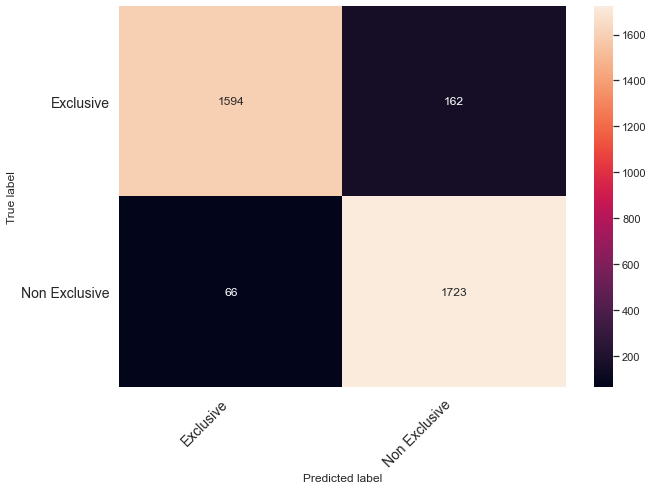

In [150]:
predictions = clf_K.predict(X_test[best_features])

print_confusion_matrix(confusion_matrix(y_test, predictions),class_names=["Exclusive", "Non Exclusive"])
print(classification_report(y_test, predictions))

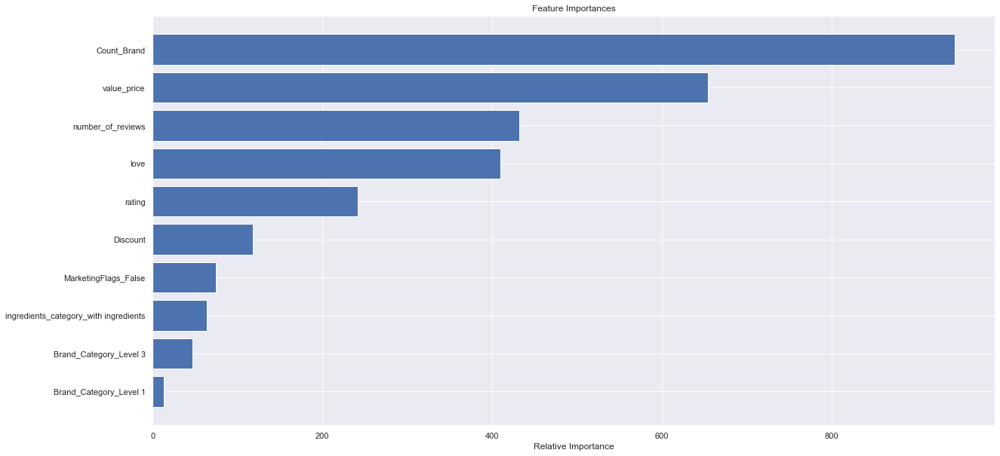

In [151]:
importances = clf_K.feature_importances_
indices = np.argsort(importances)
features=X_train2.columns
plt.figure(figsize=(20,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')
plt.savefig('filename.png', dpi=300)

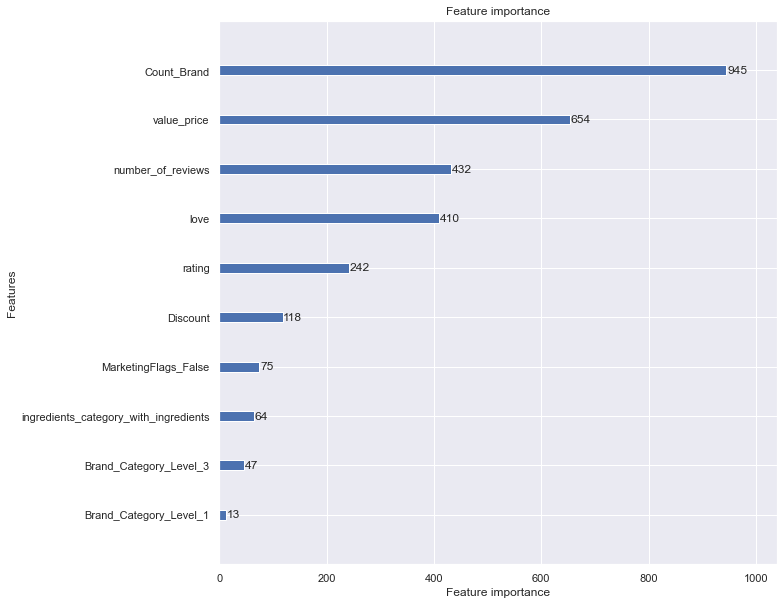

In [152]:
#We fit our Classifier Model
clf_K.fit(X_train2, y_train)
#Create Plot
b = lgb.plot_importance(clf_K)
fig = b.figure
fig.set_size_inches(10, 10)
plt.show()

# Optimation

In [153]:
from lightgbm import LGBMClassifier
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

In [154]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from pprint import pprint


# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

from sklearn.model_selection import GridSearchCV

clf_lgb = LGBMClassifier()
lgb_random = RandomizedSearchCV(estimator = clf_lgb, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgb_random.fit(X_train2, y_train)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   42.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  7.7min finished


RandomizedSearchCV(cv=3, estimator=LGBMClassifier(), n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [155]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from pprint import pprint


# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

from sklearn.model_selection import GridSearchCV

clf_rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = clf_rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train2, y_train)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 10.7min finished


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

#Initialize Classifier

In [156]:
lgb1 = LGBMClassifier(n_estimators            = lgb_random.best_params_.get('n_estimators'),
                    max_features        = lgb_random.best_params_.get('max_features'),
                    max_depth        = lgb_random.best_params_.get('max_depth'),
                    min_samples_split     = lgb_random.best_params_.get('min_samples_split'),
                    min_samples_leaf    = lgb_random.best_params_.get('min_samples_leaf'),
                    bootstrap = lgb_random.best_params_.get('bootstrap'))

In [157]:
lgb1

LGBMClassifier(bootstrap=True, max_depth=10, max_features='sqrt',
               min_samples_leaf=4, min_samples_split=2, n_estimators=1600)

In [158]:
rf = RandomForestClassifier(n_estimators            = lgb_random.best_params_.get('n_estimators'),
                    max_features        = lgb_random.best_params_.get('max_features'),
                    max_depth        = lgb_random.best_params_.get('max_depth'),
                    min_samples_split     = lgb_random.best_params_.get('min_samples_split'),
                    min_samples_leaf    = lgb_random.best_params_.get('min_samples_leaf'),
                    bootstrap = lgb_random.best_params_.get('bootstrap'))

#Run Model

In [159]:
result_lgb1 = lgb1.fit(X_train2, y_train)

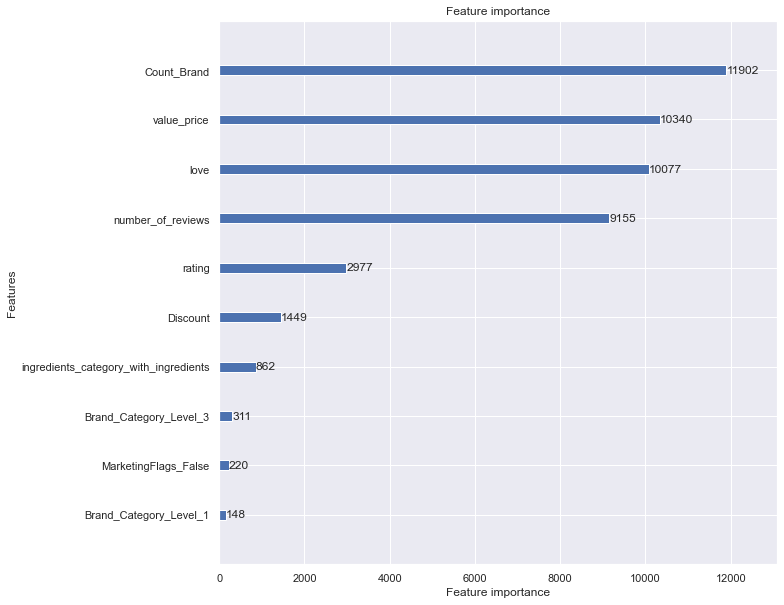

In [160]:
#Create Plot
b = lgb.plot_importance(lgb1)
fig = b.figure
fig.set_size_inches(10, 10)
plt.show()

              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94      1756
         1.0       0.93      0.96      0.95      1789

    accuracy                           0.95      3545
   macro avg       0.95      0.95      0.95      3545
weighted avg       0.95      0.95      0.95      3545



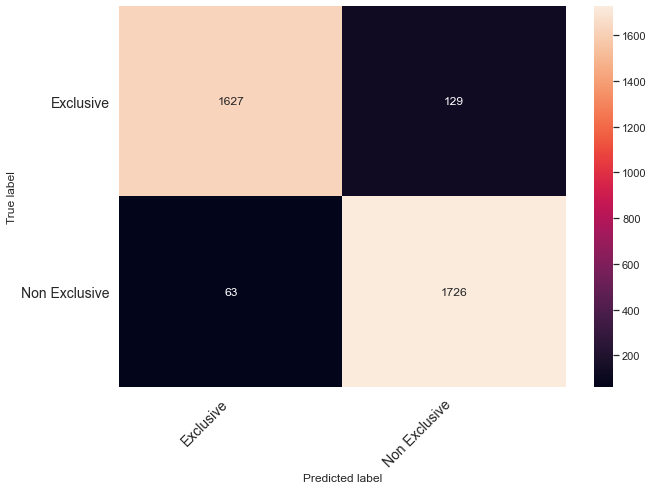

In [161]:
predictions = result_lgb1.predict(X_test[best_features])

print_confusion_matrix(confusion_matrix(y_test, predictions),class_names=["Exclusive", "Non Exclusive"])
print(classification_report(y_test, predictions))

In [162]:
result_rf1 = rf.fit(X_train2, y_train)

In [163]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, log_loss
import timeit

In [164]:
def model_performace(model, x_test, y_test):
    #Make Prediction
    y_pred       = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)

    #Generate model performance
    print('')
    print(classification_report(y_test, y_pred))

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    print('Confusion Matrix : ' + "[" + str(tp) + "," + str(fp) + "][" + str(fn) + "," + str(tn) + "]")
    print("")

    fpr,tpr,threshold = roc_curve(y_test, y_pred)
    score_auc = auc(fpr, tpr)
    score_rocauc = roc_auc_score(y_test, y_pred_proba[:,1])

    print('Accuracy      : {0:2.6f}'.format((tp+tn)*1./(tp+fp+tn+fn)))
    print('Sensitivity   : {0:2.6f}'.format((tp)*1./(tp+fn)))
    print('Spesificity   : {0:2.6f}'.format((tn)*1./(tn+fp)))
    print('Precision     : {0:2.6f}'.format((tp)*1./(tp+fp)))
    print('ROC AUC Score : {0:2.6f}'.format(score_rocauc))
    print('AUC Score     : {0:2.6f}'.format(score_auc))

    bench = y_train.value_counts(normalize=True)
    print('')
    print('Benchmark : ')
    print(bench)
    
    return fpr, tpr, score_auc, y_pred, y_pred_proba

In [165]:
start_time = timeit.default_timer()

In [166]:
fpr_xgb0, tpr_xgb0, score_auc_xgb0, y_pred_xgb0, y_pred_proba_xgb0 = model_performace(result_lgb1,X_train2,y_train)

elapsed = (timeit.default_timer() - start_time)/60.
print('')
print('Elapsed time for XGBoost {0:6.6f} min'.format(elapsed))


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      4152
         1.0       1.00      1.00      1.00      4119

    accuracy                           1.00      8271
   macro avg       1.00      1.00      1.00      8271
weighted avg       1.00      1.00      1.00      8271

Confusion Matrix : [4119,0][0,4152]

Accuracy      : 1.000000
Sensitivity   : 1.000000
Spesificity   : 1.000000
Precision     : 1.000000
ROC AUC Score : 1.000000
AUC Score     : 1.000000

Benchmark : 
0.0    0.501995
1.0    0.498005
Name: exclusive, dtype: float64

Elapsed time for XGBoost 0.009776 min


#Generate model performance

In [167]:
fpr_xgb1, tpr_xgb1, score_auc_xgb1, y_pred_xgb1, y_pred_proba_xgb1 = model_performace(result_lgb1,X_test2,y_test)

elapsed = (timeit.default_timer() - start_time)/60.
print('')
print('Elapsed time for LOGIT {0:6.6f} min'.format(elapsed))


              precision    recall  f1-score   support

         0.0       0.96      0.93      0.94      1756
         1.0       0.93      0.96      0.95      1789

    accuracy                           0.95      3545
   macro avg       0.95      0.95      0.95      3545
weighted avg       0.95      0.95      0.95      3545

Confusion Matrix : [1726,129][63,1627]

Accuracy      : 0.945839
Sensitivity   : 0.964785
Spesificity   : 0.926538
Precision     : 0.930458
ROC AUC Score : 0.987726
AUC Score     : 0.945661

Benchmark : 
0.0    0.501995
1.0    0.498005
Name: exclusive, dtype: float64

Elapsed time for LOGIT 0.014823 min


### Coba Predict

In [168]:
#coba predict
prob_of_0 = clf_K.predict_proba(X_test2)[:,0]
prob_of_1 = clf_K.predict_proba(X_test2)[:,1]
pred = clf_K.predict(X_test2)
real = y_test

In [169]:
hasil = pd.DataFrame(data=[prob_of_0, prob_of_1, pred, real], index = ["prob_of_0", "prob_of_1", "pred", "real"])
hasil = hasil.transpose()
hasil.head()

,prob_of_0,prob_of_1,pred,real
0,0.014964,0.985036,1.0,1.0
1,0.010756,0.989244,1.0,1.0
2,0.999768,0.000232,0.0,0.0
3,0.919616,0.080384,0.0,0.0
4,0.001376,0.998624,1.0,1.0


In [170]:
test_fn['exclusive'] = result_lgb1.predict(test_fn[best_features])

In [171]:
test_fn['exclusive'] = result_rf1.predict(test_fn[best_features])

In [172]:
test_fn.head()

,rating,number_of_reviews,love,value_price,Count_Brand,Discount,category_Accessories,category_After Sun Care,category_Aftershave,category_Anti-Aging,...,Brand_Category_Level 1,Brand_Category_Level 2,Brand_Category_Level 3,Brand_Category_Level 4,Discount_Category_Level 1,Discount_Category_Level 2,Discount_Category_Level 3,Discount_Category_Level 4,Discount_Category_nan,exclusive
id,,,,,,,,,,,,,,,,,,,,,
2294049,-0.486299,-0.299956,-0.330451,-0.259291,0.082867,-0.193338,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0.0
2294312,0.009905,1.928895,0.390136,-0.562589,0.009711,-0.193338,0,0,0,0,...,0,0,0,1,0,0,0,0,1,1.0
2294346,-3.959721,-0.316799,-0.377254,0.569723,-0.301201,-0.193338,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0.0
2294353,-3.959721,-0.316799,-0.376643,0.569723,-0.301201,-0.193338,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0.0
2294361,-3.959721,-0.316799,-0.378850,0.569723,-0.301201,-0.193338,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0.0


# Predict

In [173]:
predict1 = test_fn['exclusive']
predict1.head()

id
2294049    0.0
2294312    1.0
2294346    0.0
2294353    0.0
2294361    0.0
Name: exclusive, dtype: float64

In [174]:
predict2 = predict1.reset_index()
predict2.head()

,id,exclusive
0,2294049,0.0
1,2294312,1.0
2,2294346,0.0
3,2294353,0.0
4,2294361,0.0


In [175]:
predict2.to_csv('samplesub_RFOptimisasiFN.csv', index=True)

# ROC AUC Chart

In [177]:
import timeit

In [178]:
#Model Evaluation
def model_performace(model, x_test, y_test):
    #Make Prediction
    y_pred       = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)

    #Generate model performance
    print('')
    print(classification_report(y_test, y_pred))

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    print('Confusion Matrix : ' + "[" + str(tp) + "," + str(fp) + "][" + str(fn) + "," + str(tn) + "]")
    print("")

    fpr,tpr,threshold = roc_curve(y_test, y_pred)
    score_auc = auc(fpr, tpr)
    score_rocauc = roc_auc_score(y_test, y_pred_proba[:,1])

    print('Accuracy      : {0:2.6f}'.format((tp+tn)*1./(tp+fp+tn+fn)))
    print('Sensitivity   : {0:2.6f}'.format((tp)*1./(tp+fn)))
    print('Spesificity   : {0:2.6f}'.format((tn)*1./(tn+fp)))
    print('Precision     : {0:2.6f}'.format((tp)*1./(tp+fp)))
    print('ROC AUC Score : {0:2.6f}'.format(score_rocauc))
    print('AUC Score     : {0:2.6f}'.format(score_auc))

    bench = y_train.value_counts(normalize=True)
    print('')
    print('Benchmark : ')
    print(bench)
    
    return fpr, tpr, score_auc, y_pred, y_pred_proba

In [179]:
fpr_logit0, tpr_logit0, score_auc_logit0, y_pred_logit0, y_pred_proba_logit0 = model_performace(clf_K,X_train2,y_train)




              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      4152
         1.0       0.97      0.99      0.98      4119

    accuracy                           0.98      8271
   macro avg       0.98      0.98      0.98      8271
weighted avg       0.98      0.98      0.98      8271

Confusion Matrix : [4079,137][40,4015]

Accuracy      : 0.978600
Sensitivity   : 0.990289
Spesificity   : 0.967004
Precision     : 0.967505
ROC AUC Score : 0.998572
AUC Score     : 0.978646

Benchmark : 
0.0    0.501995
1.0    0.498005
Name: exclusive, dtype: float64


In [180]:
from sklearn.metrics import roc_curve, auc

In [181]:
def roc_plot(clf_K, X_test2,y_test):
    probs = clf_K.predict_proba(X_test2)
    preds = probs[:,1]
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)
    
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

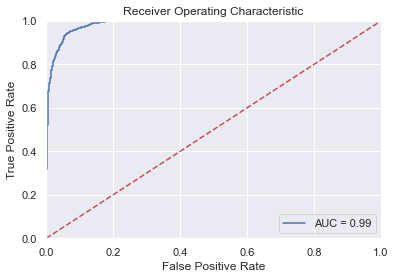

In [182]:
roc_plot(clf_K, X_test2,y_test)

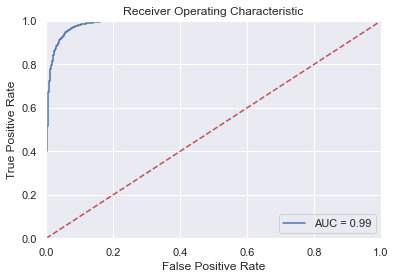

In [183]:
roc_plot(result_lgb1, X_test2,y_test)